In [36]:
import matplotlib.pyplot as plt
from skimage import io, color
import seaborn as sns
from skimage.color import rgb2gray
import numpy as np
import cv2
from corners import corner_response, harris_corners
from utils import compute_gradients
import cv2
import numpy as np
import matplotlib.pyplot as plt
from distances import normalize_descriptor
from Ransac import Ransac
from parameters import N_ITERATIONS, ERROR, THRESHOLD_MATCHES, SAMPLE_SIZE, MIN_DISTANCE, K
import itertools
import pandas as pd
from tqdm import tqdm  


# FOLDER STRUCTURE OVERVIEW
- Aurora_Ghiardelli_First_Assignment_CV2024.ipynb
    → Main Jupyter notebook containing the assignment work (likely combining code, explanations, and results).

- Ransac.py
    → Core module implementing the RANSAC algorithm.

- ransac_experiments.csv
    → Results or log file of experiments, possibly storing metrics or outcomes from different RANSAC runs.

- corners.py
    → Functions for detecting or processing image corners (Harris).

- distances.py
    → Utility functions to compute Euclidea function and related support functions.

- parameters.py
    → Configuration file holding constants or hyperparameters (like thresholds, iteration limits, etc.).

- patches.py
    → Functions for extracting or processing image patches (regions of interest).

- utils.py
    → General utility functions that support the main modules (e.g., image loading, drawing functions, timing).

# Read Images, preprocess them.

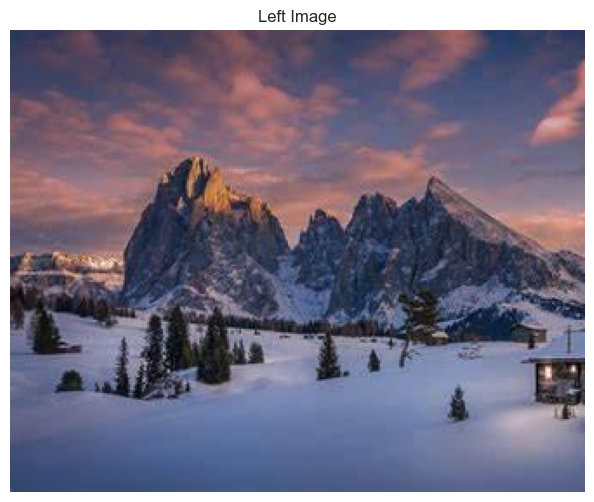

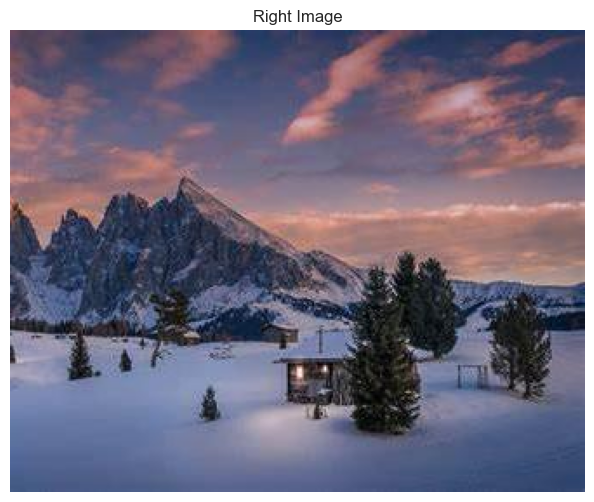

In [37]:
# load the image
def show_image(img, title='Image', cmap='gray'):
    plt.figure(figsize=(8, 6))
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()


left_img = io.imread('data/alps_left.jpg')
right_img = io.imread('data/alps_right.jpg')
show_image(left_img, 'Left Image')
show_image(right_img, 'Right Image')
left_gray = color.rgb2gray(left_img)
right_gray = color.rgb2gray(right_img)





We normalize the image, in order to make them comparable and in order to facilitate the process.

We want to see if the image is well balanced, for example if the histogram is concentrated around low values of if is concentrated on high values. 

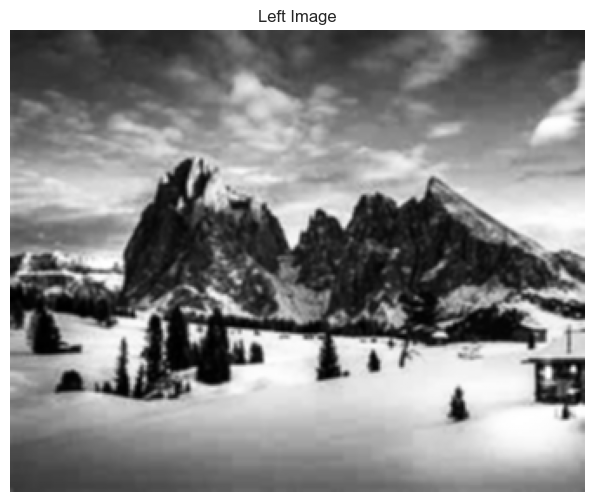

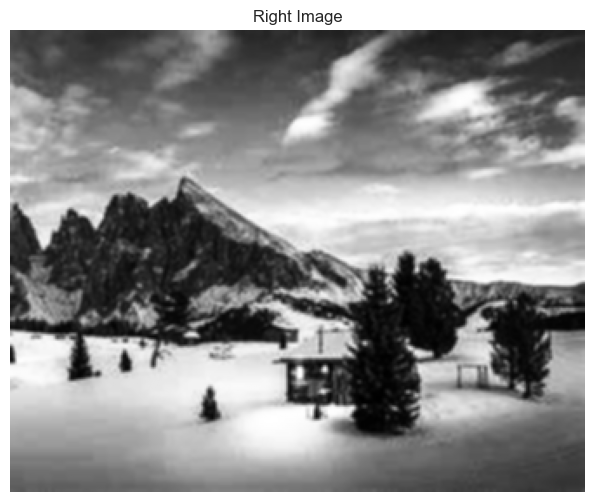

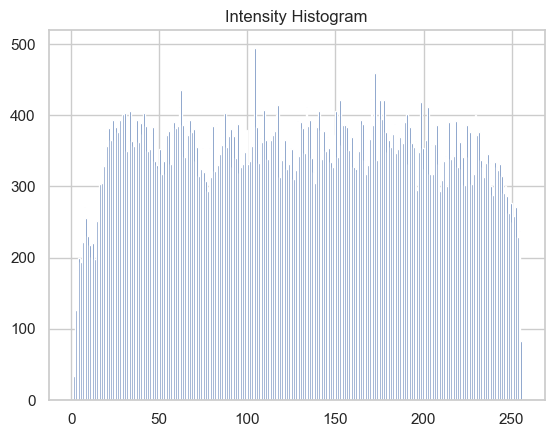

In [38]:
! pip install opencv-python
# Histogram Equalization
left_gray_8bit = (left_gray * 255).astype(np.uint8)
right_gray_8bit = (right_gray * 255).astype(np.uint8)
left_gray = cv2.equalizeHist(left_gray_8bit)
right_gray = cv2.equalizeHist(right_gray_8bit)

left_gray = cv2.GaussianBlur(left_gray, (3, 3), 1)
right_gray = cv2.GaussianBlur(right_gray, (3, 3), 1)

show_image(left_gray, 'Left Image')
show_image(right_gray, 'Right Image')

plt.hist(left_gray.ravel(), bins=256, range=[0,256])
plt.title('Intensity Histogram')
plt.show()



We can see that the image covers almost the entire grayscale spectrum indicating a good contrast range. 
Furthermore there are no strong peaks and there is a balanced brightness. 
Because of this we don't need histogram equalization. 

# 1. Harris Corner Detection

This code uses the function harris_corners described in the file corners.py. The function uses: 

- corner_harris from skimage. It computes a corner response map from the grayscale image based on a specified sigma (smoothing level).

- It extracts local maxima in the response using corner_peaks, filtering with parameters: 

    - min_distance: to avoid clustered corners.

    - threshold_rel: relative threshold to select strong corners.

    - exclude_border: to avoid edges, based on size.

Visualization: if plot=True, It displays detected corners over the image for visual inspection. 


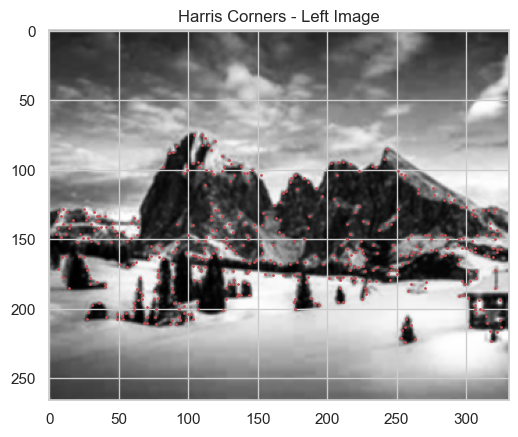

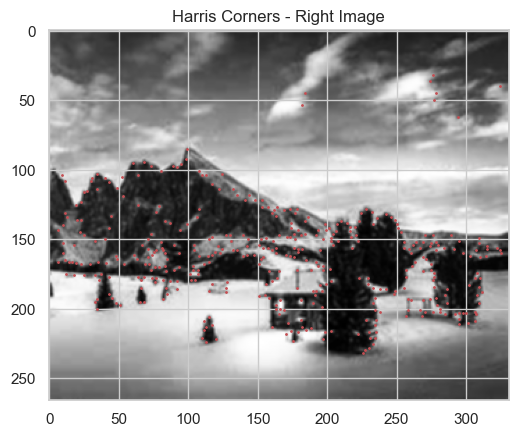

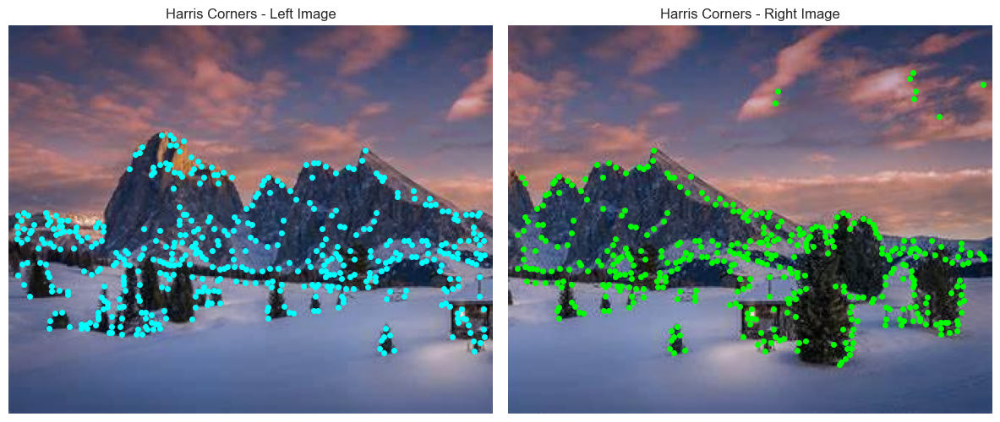

In [39]:
# Apply Harris 

left_corners = harris_corners(left_gray, plot=True, image_name='Left Image')
right_corners = harris_corners(right_gray, plot=True, image_name='Right Image')

# Plotting the Harris corners on the images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(left_img)
axes[0].plot(left_corners[:, 1], left_corners[:, 0], color='cyan', marker='o',
             linestyle='None', markersize=4, label='Harris Corners')
axes[0].set_title('Harris Corners - Left Image')
axes[0].axis('off')

axes[1].imshow(right_img)
axes[1].plot(right_corners[:, 1], right_corners[:, 0], color='lime', marker='o',
             linestyle='None', markersize=4, label='Harris Corners')
axes[1].set_title('Harris Corners - Right Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()

Selected keypoint indices: [90, 343, 225, 1, 38]
Patch size: 8
5


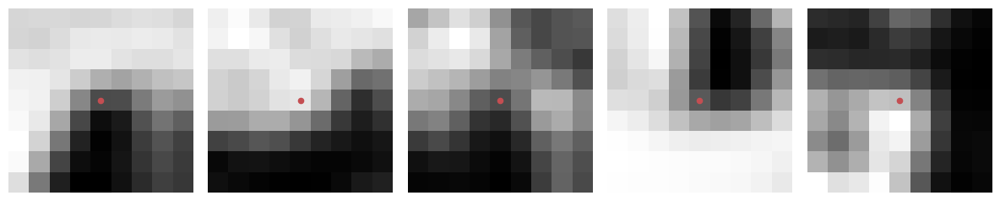

Patch size: 16
4


IndexError: index 4 is out of bounds for axis 0 with size 4

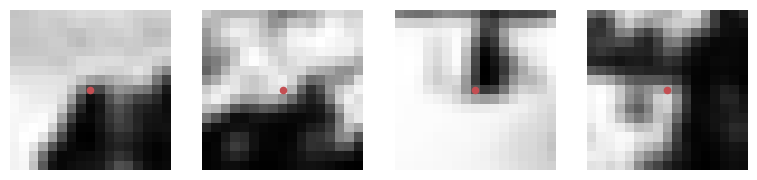

In [40]:
from patches import extract_patches, show_patches_with_keypoints
import random
patch_sizes = [8, 16, 24, 32, 40, 48, 56, 64]
num_to_show = 5
fixed_indices = random.sample(range(len(left_corners)), min(num_to_show, len(left_corners)))
print(f"Selected keypoint indices: {fixed_indices}")
fixed_keypoints = [left_corners[i] for i in fixed_indices]

for size in patch_sizes:
    patches, valid_coords = extract_patches(left_gray, fixed_keypoints, size)
    print(f"Patch size: {size}")
    print(len(patches))
    show_patches_with_keypoints(patches, size, range(num_to_show), num_show=num_to_show)




Because we know that gradients have multiple dominant directions, we want to be sure that in the patches they change with respect to all directions. 


patch size:  8, mean:  88.54 std:  85.62411109027643
patch size:  16, mean:  92.02083333333333 std:  85.63889536481396
patch size:  24, mean:  93.46808510638297 std:  85.96234976537255
patch size:  32, mean:  89.62222222222222 std:  84.81726472282475
patch size:  40, mean:  89.62222222222222 std:  84.81726472282475
patch size:  48, mean:  90.88372093023256 std:  85.50485075382419
patch size:  56, mean:  91.6829268292683 std:  85.9257873284792
patch size:  64, mean:  96.33333333333333 std:  85.54840684974744
{8: [np.uint8(6), np.uint8(243), np.uint8(0), np.uint8(1), np.uint8(161), np.uint8(79), np.uint8(196), np.uint8(117), np.uint8(33), np.uint8(0), np.uint8(0), np.uint8(133), np.uint8(1), np.uint8(205), np.uint8(92), np.uint8(51), np.uint8(0), np.uint8(110), np.uint8(72), np.uint8(24), np.uint8(0), np.uint8(0), np.uint8(244), np.uint8(0), np.uint8(96), np.uint8(48), np.uint8(4), np.uint8(159), np.uint8(148), np.uint8(125), np.uint8(121), np.uint8(254), np.uint8(39), np.uint8(1), np.ui

C:\Users\Aurora Pia Ghiardell\AppData\Local\Temp\ipykernel_27200\1399790977.py:30: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(distribution_R, labels=[f"Patch {patch_size}" for patch_size in R_values_patch_size], showmeans=True)


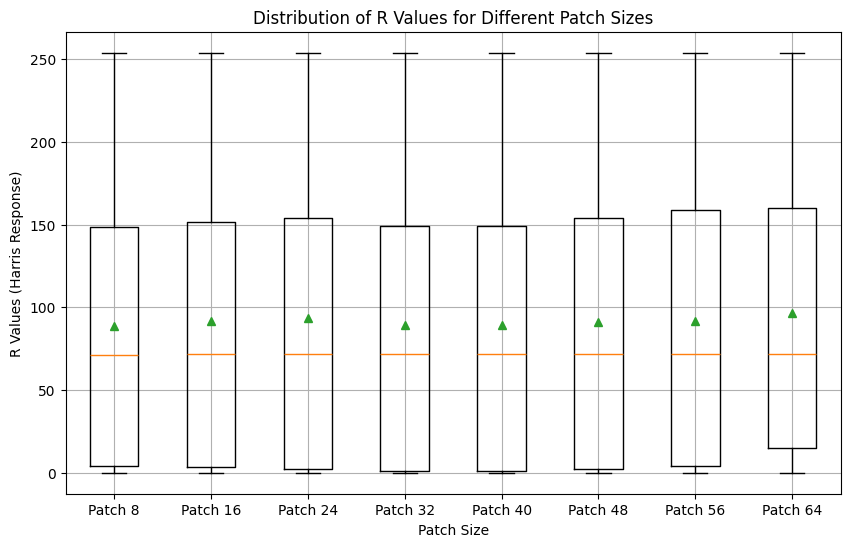

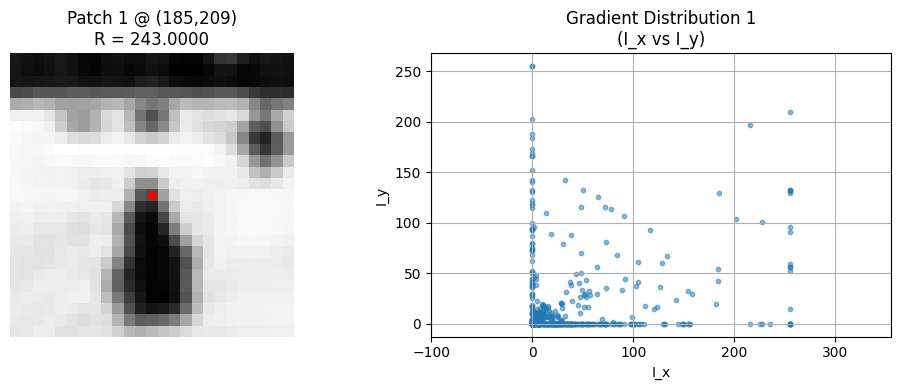

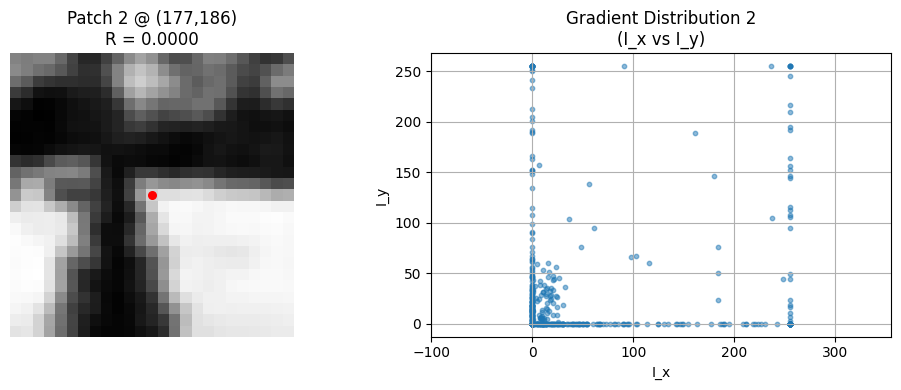

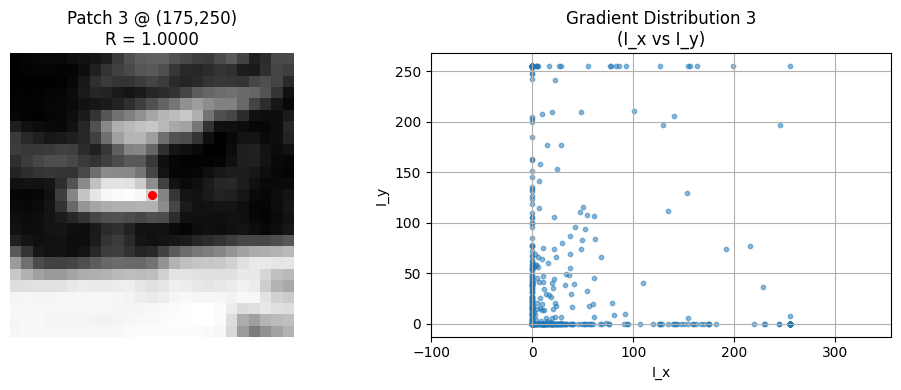

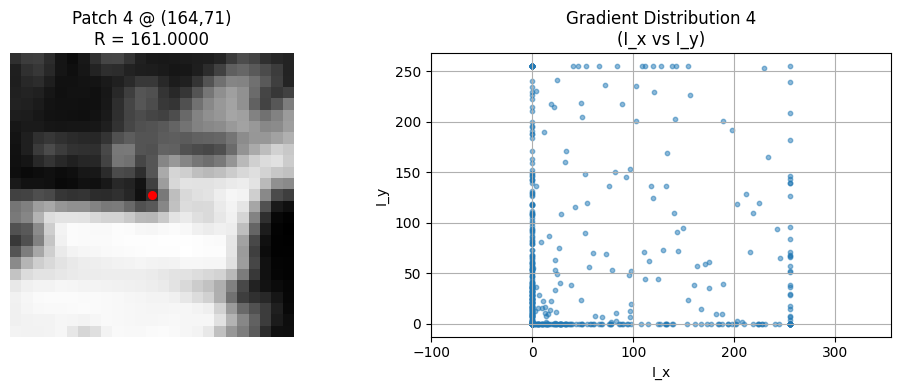

...

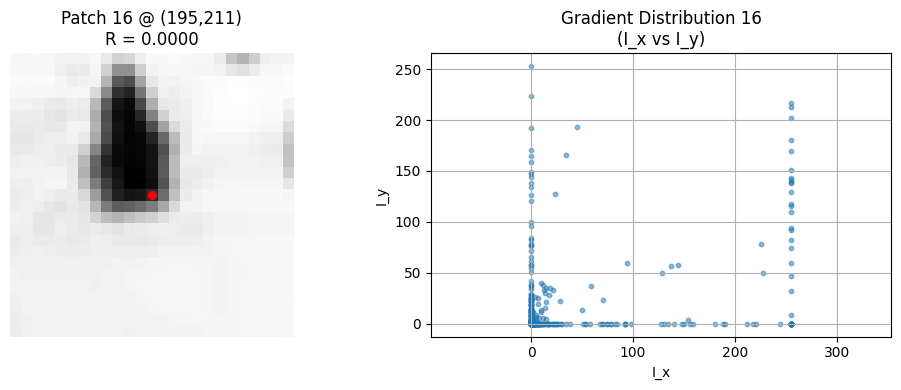

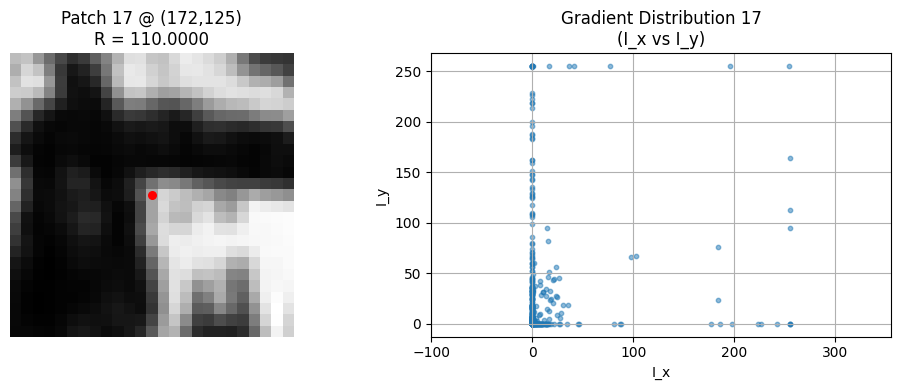

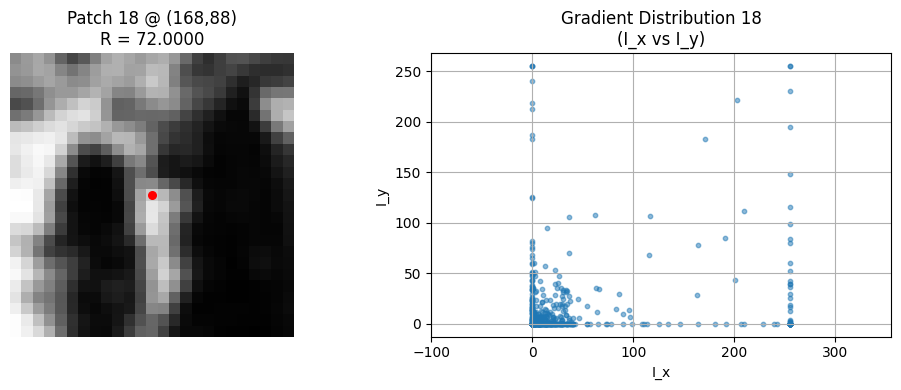

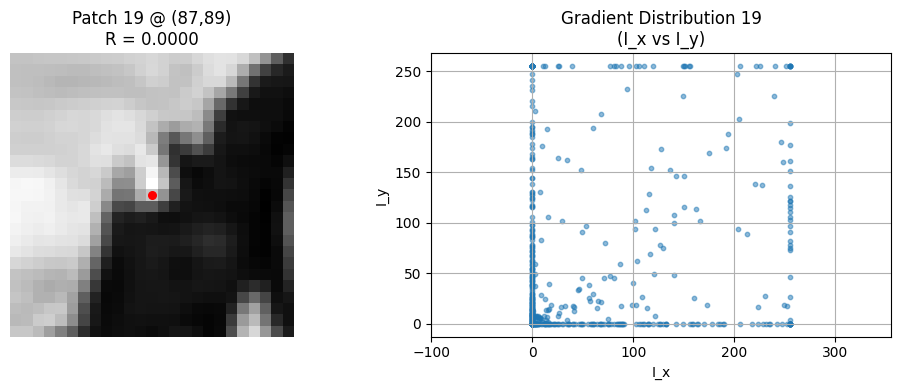

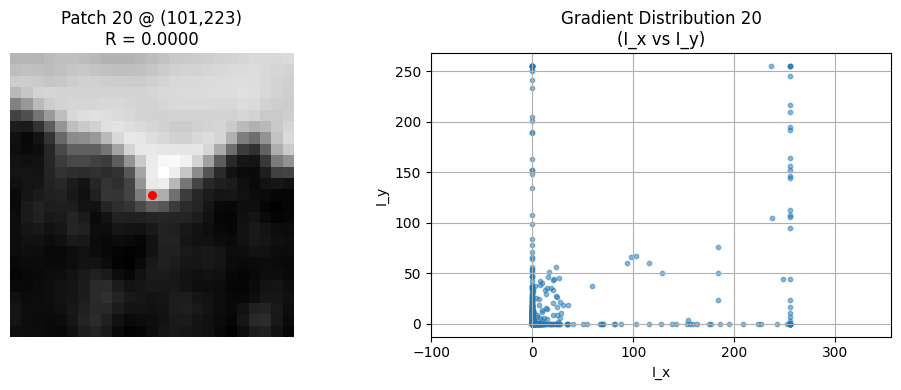

In [ ]:


R_values_patch_size = {}
Patch_gradients_patch_size = {}
patch_sizes = [8, 16, 24, 32, 40, 48, 56, 64]

for patch_size in patch_sizes:
    R_values = [] 
    half_size = patch_size // 2
    patch_gradients = []
    valid_keypoints = []  
    for y, x in left_corners[:50]:  
        if y - half_size < 0 or y + half_size >= left_gray.shape[0] or \
        x - half_size < 0 or x + half_size >= left_gray.shape[1]:
            continue  
        
        patch = left_gray[y - half_size : y + half_size + 1, x - half_size : x + half_size + 1]
        Ix, Iy = compute_gradients(patch)
        R = corner_response(patch, Ix, Iy)
        patch_gradients.append((Ix.flatten(), Iy.flatten()))
        valid_keypoints.append((y, x))
        R_values.append(R[half_size, half_size]) 

    print("patch size: ", f"{patch_size},", "mean: ", np.mean(R_values), "std: ", np.std(R_values))

    R_values_patch_size[patch_size] = R_values
    Patch_gradients_patch_size[patch_size] = patch_gradients

print(R_values_patch_size)
plt.figure(figsize=(10, 6))
distribution_R = [R_values_patch_size[patch_size] for patch_size in R_values_patch_size]
plt.boxplot(distribution_R, labels=[f"Patch {patch_size}" for patch_size in R_values_patch_size], showmeans=True)
plt.title("Distribution of R Values for Different Patch Sizes")
plt.xlabel("Patch Size")
plt.ylabel("R Values (Harris Response)")
plt.grid(True)
plt.show()

num_to_show = 20
patch_size = 24
half_size = patch_size // 2
for i in range(min(num_to_show, len(patch_gradients))):
    y, x = valid_keypoints[i]
    patch = left_gray[y - half_size : y + half_size + 1, x - half_size : x + half_size + 1]
    
    Ix_flat = Patch_gradients_patch_size[patch_size][i][0]
    Iy_flat = Patch_gradients_patch_size[patch_size][i][1]
    R_val = R_values_patch_size[patch_size][i]

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(patch, cmap='gray')
    plt.scatter(half_size, half_size, color='red', s=30)  
    plt.title(f'Patch {i+1} @ ({y},{x})\nR = {R_val:.4f}')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.scatter(Ix_flat, Iy_flat, s=10, alpha=0.5)
    plt.xlabel('I_x')
    plt.ylabel('I_y')
    plt.title(f'Gradient Distribution {i+1}\n(I_x vs I_y)')
    plt.grid(True)
    plt.axis('equal')
    
    plt.tight_layout()
    plt.show() 


## Sensitivity Analysis

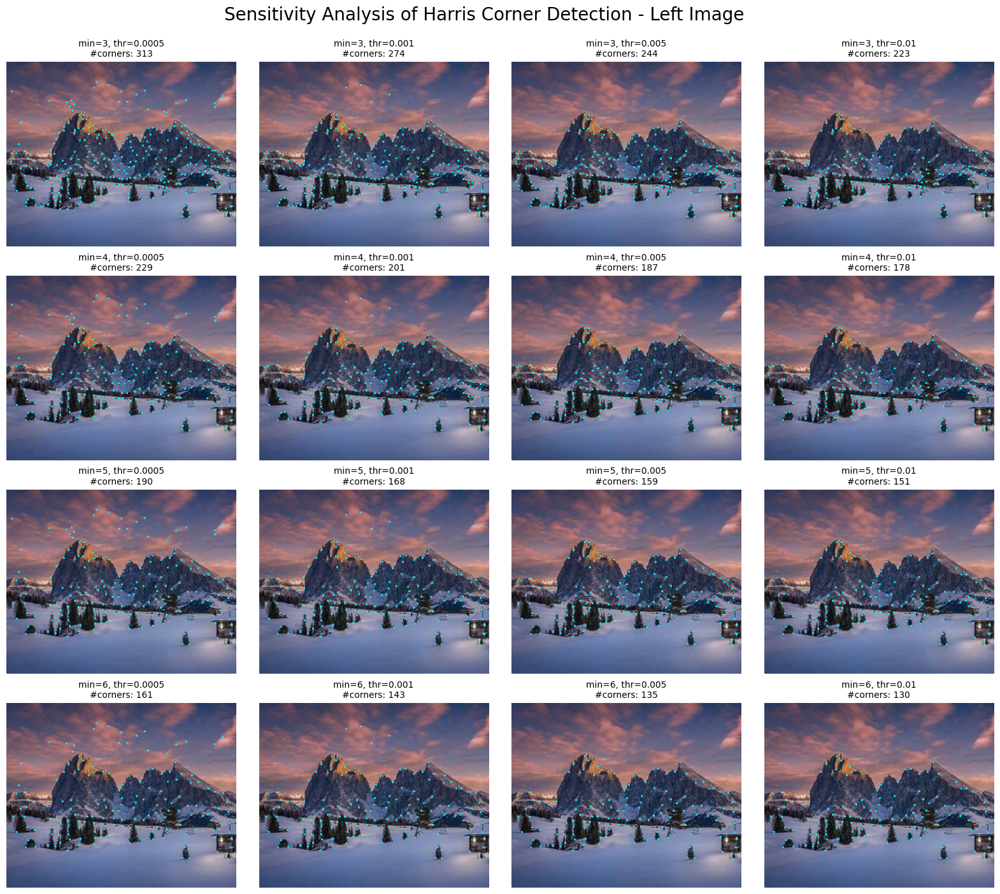

In [ ]:
import matplotlib.pyplot as plt
from skimage.feature import corner_peaks

min_distances = [3, 4, 5, 6]
threshold_rels = [0.0005, 0.001, 0.005, 0.01]

fig, axes = plt.subplots(len(min_distances), len(threshold_rels), figsize=(20, 16))
fig.suptitle("Sensitivity Analysis of Harris Corner Detection - Left Image", fontsize=20)

for i, min_dist in enumerate(min_distances):
    for j, threshold in enumerate(threshold_rels):
        coords = harris_corners(left_gray, sigma=1, min_distance = min_dist, k=threshold, plot=False, image_name='Image')
        ax = axes[i, j]
        ax.imshow(left_img, cmap='gray')
        ax.plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',
        linestyle='None', markersize=1)
        ax.set_title(f"min={min_dist}, thr={threshold}\n#corners: {len(coords)}", fontsize=10)
        ax.axis('off')

plt.subplots_adjust(wspace=0.1, hspace=0.1, top=0.93) # Reduced spacing values
plt.show()





min_dist=1, k=0.0005, number of corners: 632
min_dist=1, k=0.001, number of corners: 563
min_dist=1, k=0.005, number of corners: 466
min_dist=1, k=0.01, number of corners: 415
min_dist=2, k=0.0005, number of corners: 435
min_dist=2, k=0.001, number of corners: 384
min_dist=2, k=0.005, number of corners: 331
min_dist=2, k=0.01, number of corners: 302
min_dist=5, k=0.0005, number of corners: 190
min_dist=5, k=0.001, number of corners: 168
min_dist=5, k=0.005, number of corners: 159
min_dist=5, k=0.01, number of corners: 151
min_dist=7, k=0.0005, number of corners: 131
min_dist=7, k=0.001, number of corners: 115
min_dist=7, k=0.005, number of corners: 108
min_dist=7, k=0.01, number of corners: 105


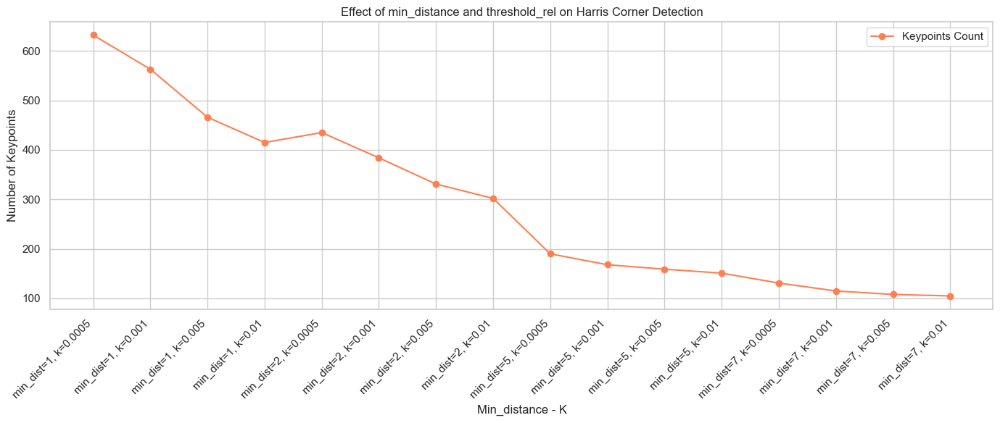

In [ ]:
min_distances = [1, 2, 5, 7]
threshold_rels = [0.0005, 0.001, 0.005, 0.01]
results = []
for min_dist in min_distances:
    for thr in threshold_rels:

        coords = harris_corners(left_gray, min_distance=min_dist, k=thr)
        label = f"min_dist={min_dist}, k={thr}"
        print(f"min_dist={min_dist}, k={thr}, number of corners: {len(coords)}")
        results.append({
            "Min_distance - K": label,
            "Number of Keypoints": len(coords)
        })


plt.figure(figsize=(14, 6))
sns.set(style="whitegrid")

sorted_results = sorted(results, key=lambda x: x["Min_distance - K"])
x = [r["Min_distance - K"] for r in sorted_results]
y = [r["Number of Keypoints"] for r in sorted_results]

plt.plot(x, y, marker='o', linestyle='-', color='coral', label="Keypoints Count")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Min_distance - K")
plt.ylabel("Number of Keypoints")
plt.title("Effect of min_distance and threshold_rel on Harris Corner Detection")
plt.tight_layout()
plt.legend()
plt.show()


Seing the distribution of the dustances of the best matches for different patch sizes.

Patch size: 8, Number of matches: 163
Patch size: 16, Number of matches: 182
Patch size: 24, Number of matches: 183
Patch size: 32, Number of matches: 178
Patch size: 40, Number of matches: 174
Patch size: 48, Number of matches: 170
Patch size: 64, Number of matches: 154


C:\Users\Aurora Pia Ghiardell\AppData\Local\Temp\ipykernel_27200\3303227945.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(distances_per_patch_size, labels=[f"Patch {size}" for size in results.keys()], showmeans=True)


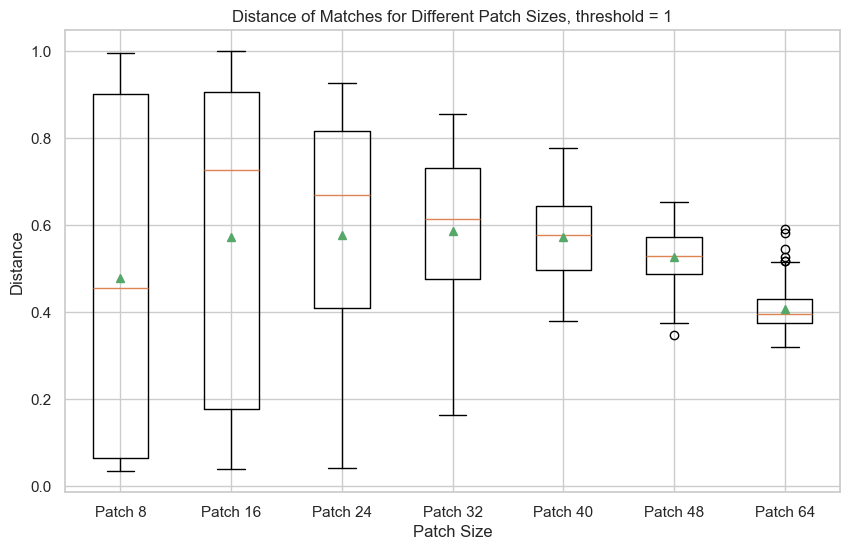

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from distances import get_matches
from parameters import THRESHOLD_MATCHES, MIN_DISTANCE, K
from corners import harris_corners
def plot_box_plots_for_distances(results, threshold=0.3):
    distances_per_patch_size = []
    for patch_size, _ in results.items():
        distances = []

        for _, values in results[patch_size].items():
            distances.append(values[1])
        distances_per_patch_size.append(distances)

    plt.figure(figsize=(10, 6))
    plt.boxplot(distances_per_patch_size, labels=[f"Patch {size}" for size in results.keys()], showmeans=True)
    plt.title(f"Distance of Matches for Different Patch Sizes, threshold = {threshold}")
    plt.xlabel("Patch Size")
    plt.ylabel("Distance")
    plt.grid(True)
    plt.show()  


def sift_descriptor_from_coords(image1, image2, threshold = 0.3, k=0.0005 , min_distance = 6, size = 32, plot=True):
    kp1 = harris_corners(image1,  k = k, min_distance=min_distance, size=size, image_name='Left Image')
    kp2 = harris_corners(image2, k = k, min_distance=min_distance, size=size,  image_name='Right Image')

    sift = cv2.SIFT_create()
    keypoints1 = [cv2.KeyPoint(x=float(corner[1]), y=float(corner[0]), size=size) for corner in kp1]
    keypoints2 = [cv2.KeyPoint(x=float(corner[1]), y=float(corner[0]), size=size) for corner in kp2]
    kp1 , des1 = sift.compute(image1, keypoints1)
    kp2 , des2 = sift.compute(image2, keypoints2)
    matches = get_matches(des1, des2, threshold=threshold)

    return kp1, des1, kp2, des2, matches


patch_sizes = [8, 16, 24,  32, 40, 48, 64]

results = {}
for patch_size in patch_sizes:
    _, des1, _, des2, good_matches = sift_descriptor_from_coords(left_gray, right_gray,  size = patch_size, threshold = 1, k = 0.0005, min_distance = 5, plot =False)
    print(f"Patch size: {patch_size}, Number of matches: {len(good_matches)}")
    results[patch_size] = good_matches

plot_box_plots_for_distances(results, threshold=1)

# 2. SIFT DESCRIPTOR


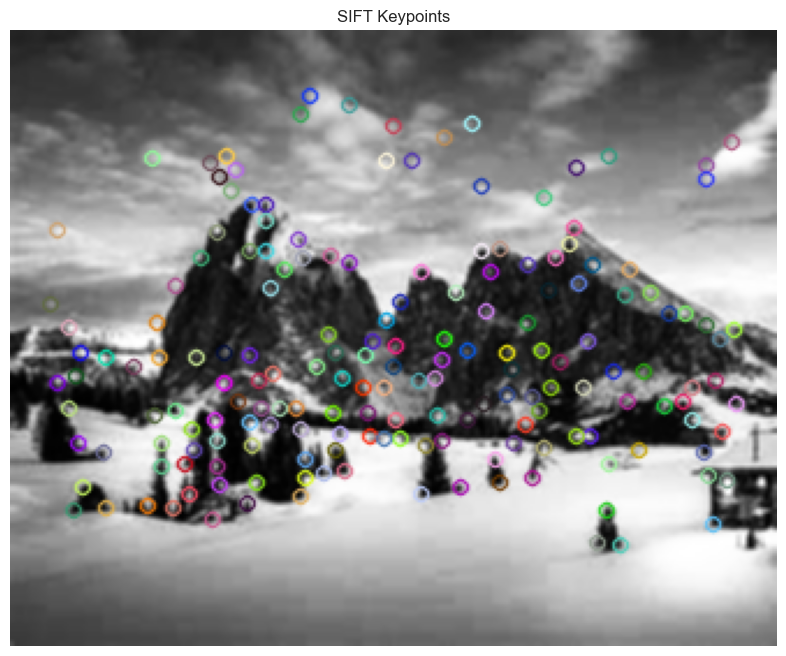

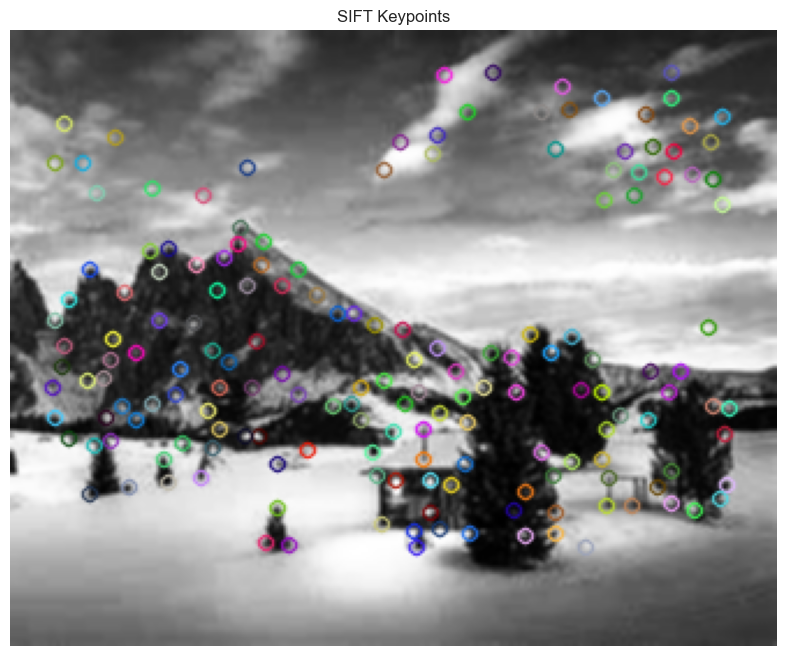

In [ ]:
from parameters import THRESHOLD_MATCHES, MIN_DISTANCE,  K
sift = cv2.SIFT_create()
keypoints_l, des1, keypoints_r, des2, good_matches = sift_descriptor_from_coords(left_gray, right_gray, threshold = THRESHOLD_MATCHES, k = K, min_distance=MIN_DISTANCE, plot =False)

img_with_keypoints = cv2.drawKeypoints(
    left_gray,
    keypoints_l,
    left_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

img_with_keypoints = cv2.drawKeypoints(
    right_gray,
    keypoints_r,
    right_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()



# 3 Similarity matrices

In [ ]:
from distances import compute_euclidian_distances

euclidean_distances = compute_euclidian_distances(des1, des2)    
print("Number of good matches: ", len(good_matches), "threshold: ", THRESHOLD_MATCHES)
print("Euclidean distances: ", euclidean_distances.shape)
print("Euclidean distances: ", euclidean_distances)


Number of good matches:  22 threshold:  0.3
Euclidean distances:  (178, 169)
Euclidean distances:  [[0.74898035 0.82632396 0.90473913 ... 1.21172842 0.72794581 1.3709978 ]
 [0.70594441 0.98255342 0.99499053 ... 1.09799908 0.90421804 1.37658645]
 [0.71375558 0.88537605 0.95837167 ... 1.20579507 0.79621174 1.35840731]
 ...
 [1.39653621 1.5452437  1.58728926 ... 1.00847201 1.47897589 0.80849533]
 [1.34905676 1.49847175 1.52727145 ... 0.79476804 1.44405047 1.01281585]
 [1.41247058 1.53030031 1.53544943 ... 0.98795081 1.49560818 0.94800826]]


# 4. Select Best Matches

Good matches:  {3: (np.int64(8), np.float64(0.2333518762885788)), 11: (np.int64(12), np.float64(0.18996481596264503)), 13: (np.int64(15), np.float64(0.2267477068073821)), 21: (np.int64(18), np.float64(0.2546020297931868)), 38: (np.int64(30), np.float64(0.19636079681551366)), 42: (np.int64(34), np.float64(0.16351007825121408)), 77: (np.int64(56), np.float64(0.23685707764874273)), 82: (np.int64(58), np.float64(0.17490320558260025)), 83: (np.int64(64), np.float64(0.2833414962312677)), 87: (np.int64(67), np.float64(0.17438213307085326)), 91: (np.int64(76), np.float64(0.2282841842103953)), 96: (np.int64(96), np.float64(0.29178220119259957)), 99: (np.int64(78), np.float64(0.27054764112217045)), 102: (np.int64(81), np.float64(0.23118954944831402)), 114: (np.int64(91), np.float64(0.22858552893277584)), 119: (np.int64(95), np.float64(0.18989695927683284)), 128: (np.int64(105), np.float64(0.21011042402019475)), 131: (np.int64(113), np.float64(0.17591461534413744)), 150: (np.int64(128), np.float6

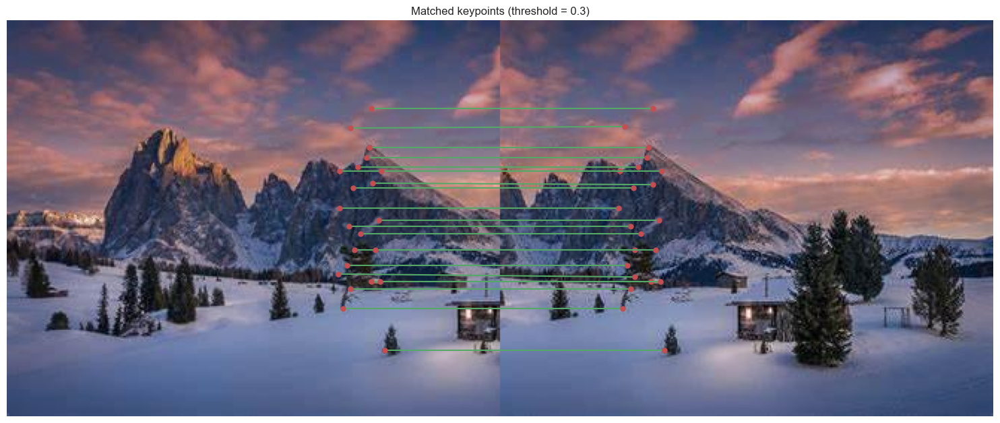

In [ ]:

print("Good matches: ", good_matches) 
num_matches = 200
sorted_matches = sorted(good_matches.items(), key=lambda x: x[1][1])
first_matches = sorted_matches[:num_matches]
# print("First 100 matches: ", first_100_matches)
combined_img = np.hstack((left_img, right_img))
offset = left_img.shape[1]
print("Offset: ", offset)
fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(combined_img)
ax.axis('off')

for el in first_matches:
    i, j = el[0], el[1][0]
    pt1 = keypoints_l[i].pt  
    pt2 = keypoints_r[j].pt
    
    x1, y1 = pt1
    x2, y2 = pt2[0] + offset, pt2[1]  
    ax.plot([x1, x2], [y1, y2], 'g-', linewidth=1.5)
    ax.plot(x1, y1, 'ro', markersize=5)
    ax.plot(x2, y2, 'ro', markersize=5)
    

plt.title(f'Matched keypoints (threshold = {THRESHOLD_MATCHES})')
plt.tight_layout()
plt.show()



# Sensitivity Analysis

Threshold: 0.2
Number of good matches:  9 threshold:  0.2
Threshold: 0.3
Number of good matches:  22 threshold:  0.3
Threshold: 0.4
Number of good matches:  32 threshold:  0.4
Threshold: 0.5
Number of good matches:  46 threshold:  0.5
Threshold: 0.6
Number of good matches:  82 threshold:  0.6
Threshold: 0.7
Number of good matches:  116 threshold:  0.7
Threshold:  0.2 mean:  0.18238062532848565 std:  0.010006780884778962
Threshold:  0.3 mean:  0.21611247494077218 std:  0.03527845177297971
Threshold:  0.4 mean:  0.25962090432643037 std:  0.07365313894284423
Threshold:  0.5 mean:  0.31843927036011105 std:  0.10867561989763502
Threshold:  0.6 mean:  0.4240309516352445 std:  0.1453575270868642
Threshold:  0.7 mean:  0.4893208624882614 std:  0.15965562433702657


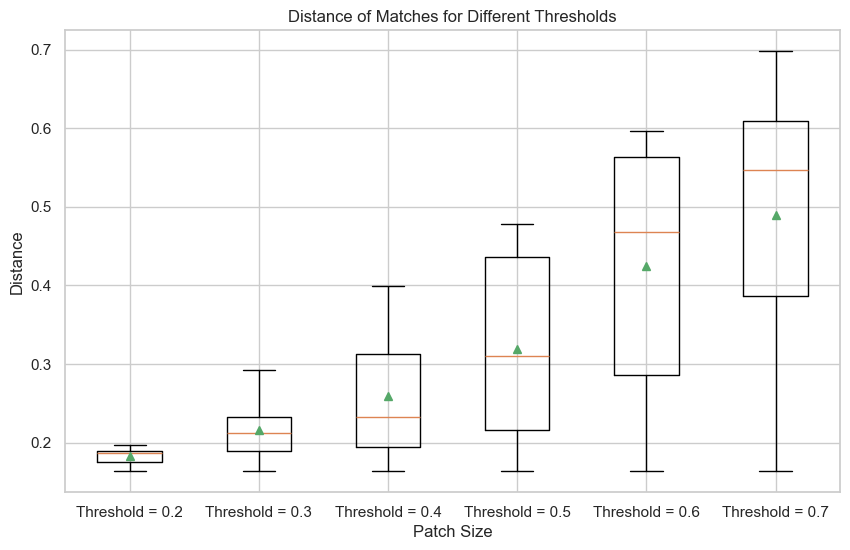

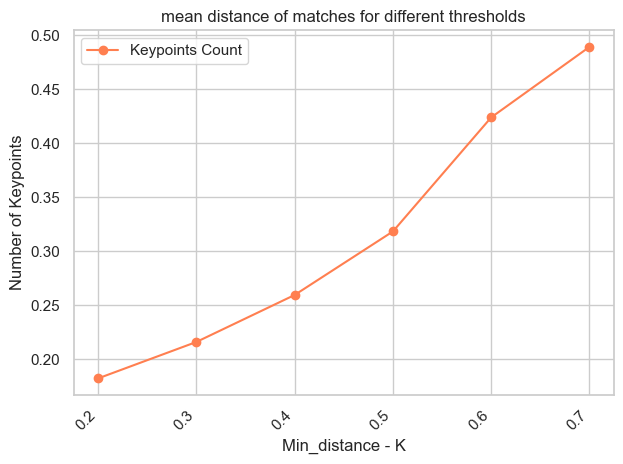

Number of matches:  25 threshold:  1.5
Number of matches:  50 threshold:  1.5
Number of matches:  75 threshold:  1.5
Number of matches:  100 threshold:  1.5
Number of matches:  150 threshold:  1.5
Number of matches:  178 threshold:  1.5
n:  25 mean:  0.22761786134518602 std:  0.04545938254764486
n:  50 mean:  0.3344689219316697 std:  0.11758149427295843
n:  75 mean:  0.4085891797930861 std:  0.1424953059743582
n:  100 mean:  0.4594454320977202 std:  0.1519082081832987
n:  150 mean:  0.5442048378246261 std:  0.17338505964999576
n:  200 mean:  0.5860153645167451 std:  0.18654944046084193


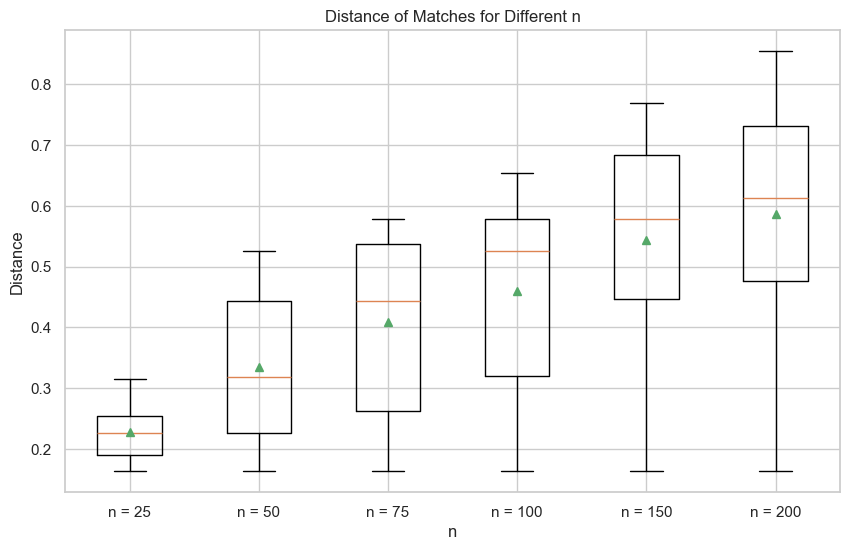

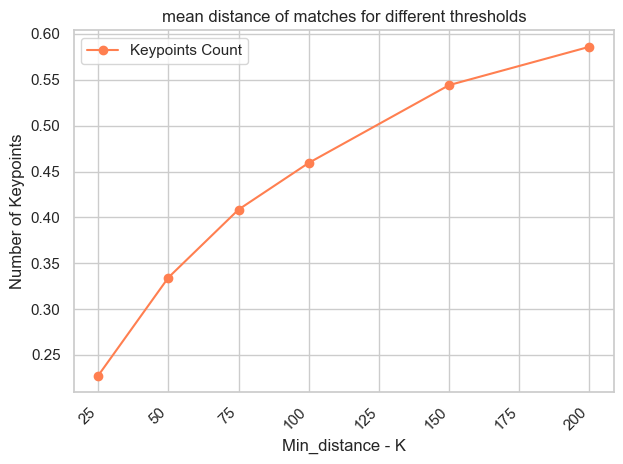

In [ ]:
from distances import plot_box_plots_distances_threshold, plot_box_plots_distances_top_n


thresholds = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

results = {}
for threshold in thresholds:
    print(f"Threshold: {threshold}")
    keypoints_l, des1, keypoints_r, des2, good_matches = sift_descriptor_from_coords(left_gray, right_gray, threshold = threshold, k = K, min_distance=MIN_DISTANCE, plot =False)
    results[threshold] = good_matches
    print("Number of good matches: ", len(good_matches), "threshold: ", threshold)

means = []
for th, _ in results.items():
    distances = []
    for _, values in results[th].items():
        distances.append(values[1])
    means.append(np.mean(distances))
    print(
        "Threshold: ",
        th,
        "mean: ",
        np.mean(distances),
        "std: ",
        np.std(distances),
    )

plot_box_plots_distances_threshold(results)
plt.plot(thresholds, means, marker='o', linestyle='-', color='coral', label="Keypoints Count")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Min_distance - K")
plt.ylabel("Number of Keypoints")
plt.title("mean distance of matches for different thresholds")
plt.tight_layout()
plt.legend()
plt.show()


top_matches = [25, 50, 75, 100, 150, 200]
results2 = {}
keypoints_l, des1, keypoints_r, des2, good_matches = sift_descriptor_from_coords(left_gray, right_gray, threshold = 1.50, k = K, min_distance=MIN_DISTANCE, plot =False)
sorted_matches = sorted(good_matches.items(), key=lambda x: x[1][1])
for i in top_matches:
    first_matches = sorted_matches[:i]
    results2[i] = first_matches
    print("Number of matches: ", len(first_matches), "threshold: ", 1.50)

distances = []
means = []
for lenght in results2:
    value = results2[lenght]
    dist = []

    for pair in value:
        dist.append(pair[1][1])
    distances.append(dist)
    means.append(np.mean(dist))

    print("n: ", lenght, "mean: ", np.mean(dist), "std: ", np.std(dist))


plot_box_plots_distances_top_n(results2)

plt.plot(top_matches, means, marker='o', linestyle='-', color='coral', label="Keypoints Count")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Min_distance - K")
plt.ylabel("Number of Keypoints")
plt.title("mean distance of matches for different thresholds")
plt.tight_layout()
plt.legend()
plt.show()



patch size:  8, mean:  88.54 std:  85.62411109027643
patch size:  16, mean:  92.02083333333333 std:  85.63889536481396
patch size:  24, mean:  93.46808510638297 std:  85.96234976537255
patch size:  32, mean:  89.62222222222222 std:  84.81726472282475
patch size:  40, mean:  89.62222222222222 std:  84.81726472282475
patch size:  48, mean:  90.88372093023256 std:  85.50485075382419
patch size:  56, mean:  91.6829268292683 std:  85.9257873284792
patch size:  64, mean:  96.33333333333333 std:  85.54840684974744
{8: [np.uint8(6), np.uint8(243), np.uint8(0), np.uint8(1), np.uint8(161), np.uint8(79), np.uint8(196), np.uint8(117), np.uint8(33), np.uint8(0), np.uint8(0), np.uint8(133), np.uint8(1), np.uint8(205), np.uint8(92), np.uint8(51), np.uint8(0), np.uint8(110), np.uint8(72), np.uint8(24), np.uint8(0), np.uint8(0), np.uint8(244), np.uint8(0), np.uint8(96), np.uint8(48), np.uint8(4), np.uint8(159), np.uint8(148), np.uint8(125), np.uint8(121), np.uint8(254), np.uint8(39), np.uint8(1), np.ui

C:\Users\Aurora Pia Ghiardell\AppData\Local\Temp\ipykernel_27200\1399790977.py:30: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(distribution_R, labels=[f"Patch {patch_size}" for patch_size in R_values_patch_size], showmeans=True)


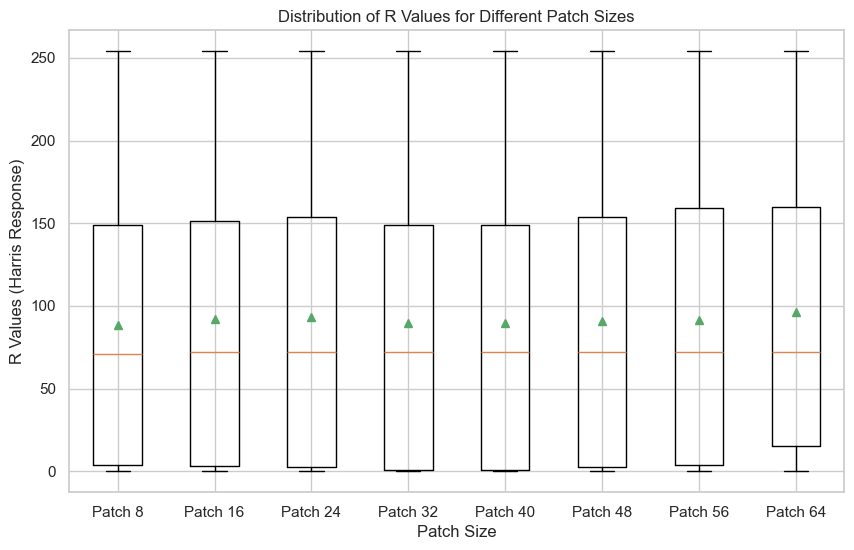

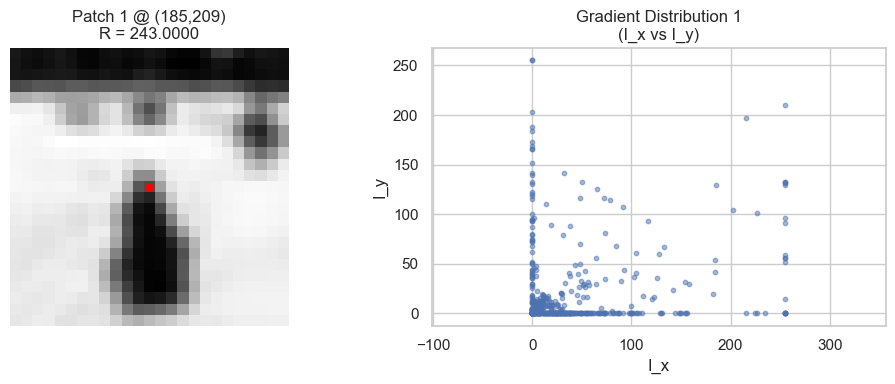

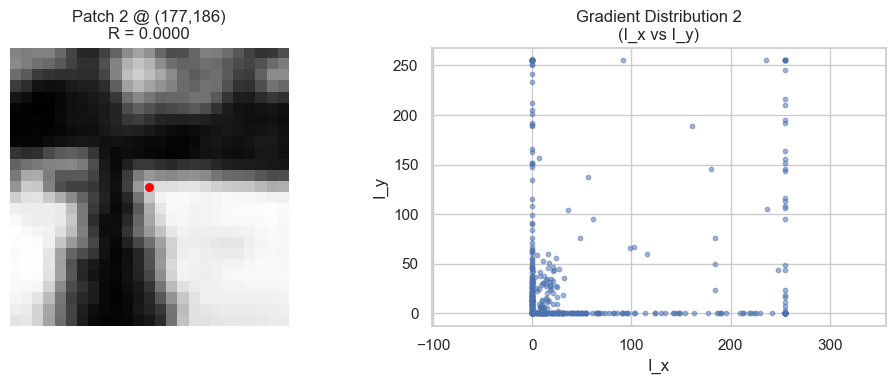

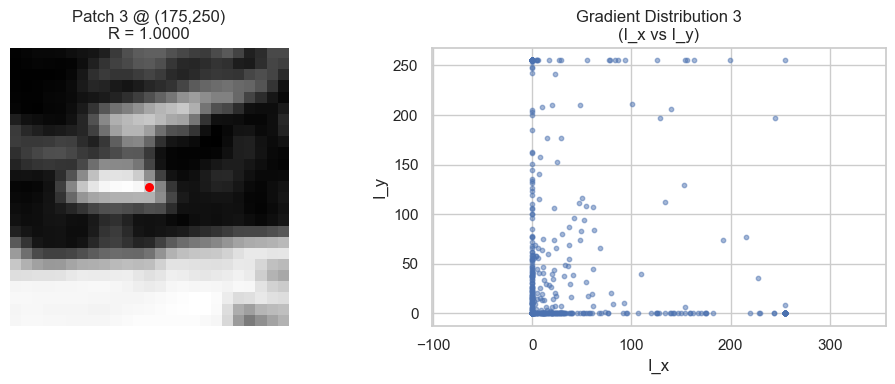

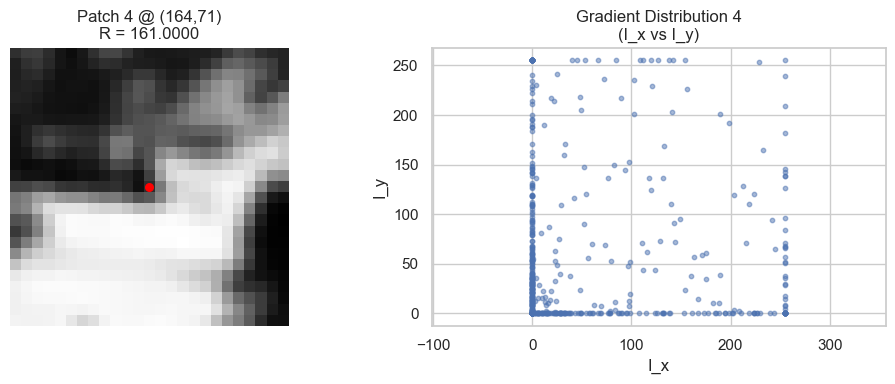

...

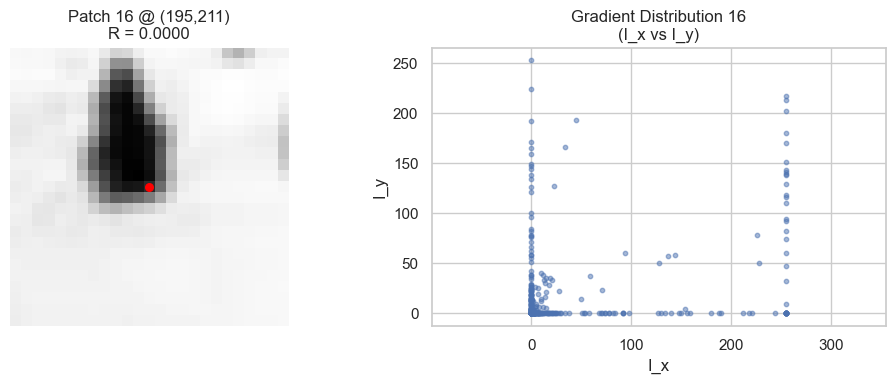

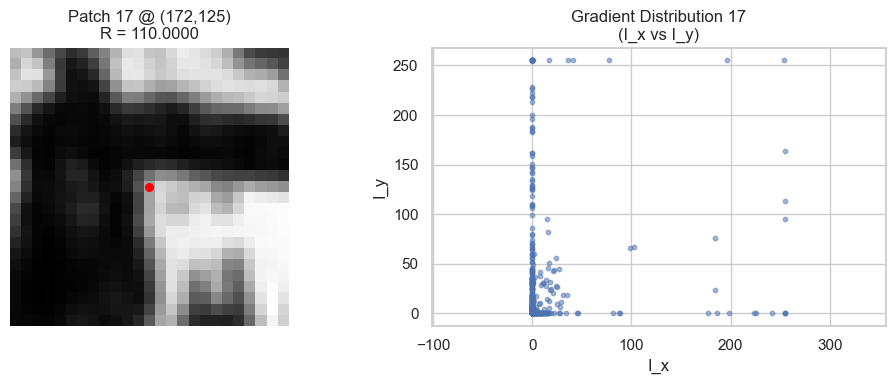

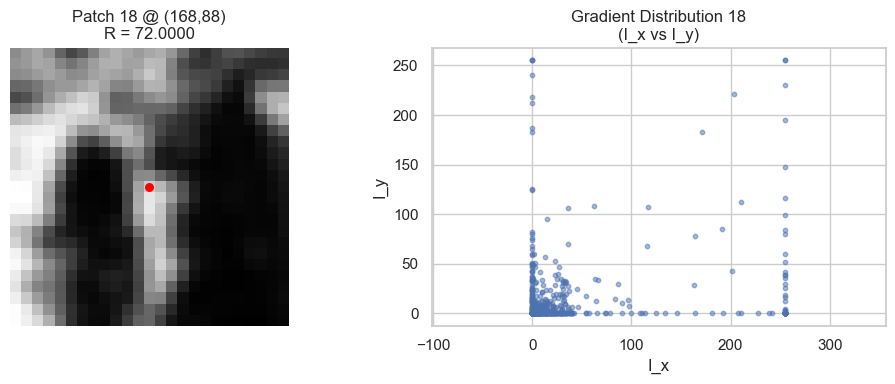

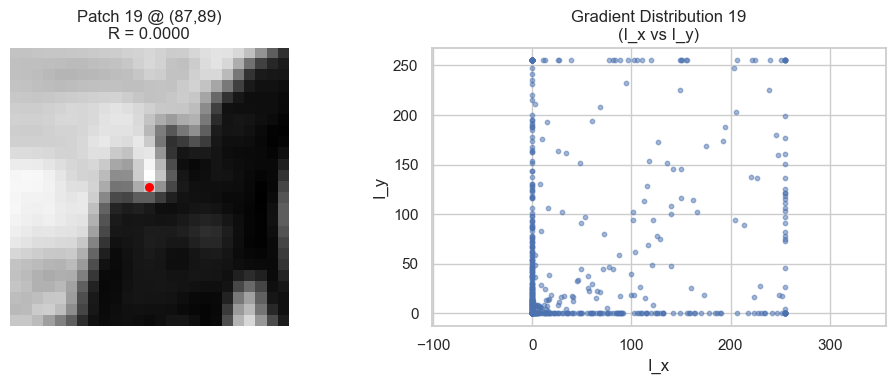

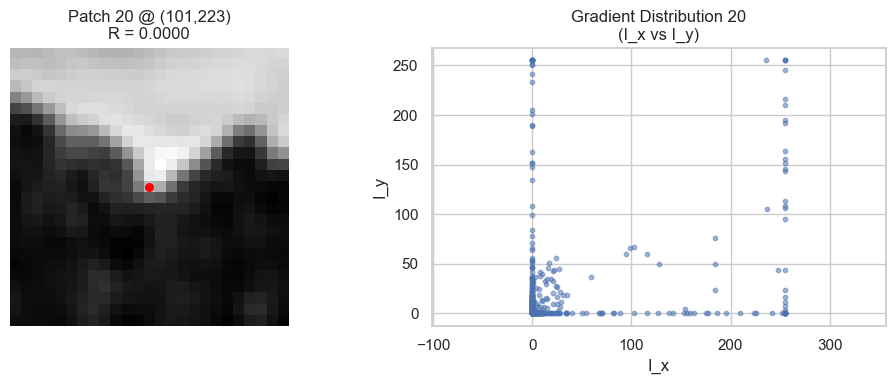

In [ ]:


R_values_patch_size = {}
Patch_gradients_patch_size = {}
patch_sizes = [8, 16, 24, 32, 40, 48, 56, 64]

for patch_size in patch_sizes:
    R_values = [] 
    half_size = patch_size // 2
    patch_gradients = []
    valid_keypoints = []  
    for y, x in left_corners[:50]:  
        if y - half_size < 0 or y + half_size >= left_gray.shape[0] or \
        x - half_size < 0 or x + half_size >= left_gray.shape[1]:
            continue  
        
        patch = left_gray[y - half_size : y + half_size + 1, x - half_size : x + half_size + 1]
        Ix, Iy = compute_gradients(patch)
        R = corner_response(patch, Ix, Iy)
        patch_gradients.append((Ix.flatten(), Iy.flatten()))
        valid_keypoints.append((y, x))
        R_values.append(R[half_size, half_size]) 

    print("patch size: ", f"{patch_size},", "mean: ", np.mean(R_values), "std: ", np.std(R_values))

    R_values_patch_size[patch_size] = R_values
    Patch_gradients_patch_size[patch_size] = patch_gradients

print(R_values_patch_size)
plt.figure(figsize=(10, 6))
distribution_R = [R_values_patch_size[patch_size] for patch_size in R_values_patch_size]
plt.boxplot(distribution_R, labels=[f"Patch {patch_size}" for patch_size in R_values_patch_size], showmeans=True)
plt.title("Distribution of R Values for Different Patch Sizes")
plt.xlabel("Patch Size")
plt.ylabel("R Values (Harris Response)")
plt.grid(True)
plt.show()

num_to_show = 20
patch_size = 24
half_size = patch_size // 2
for i in range(min(num_to_show, len(patch_gradients))):
    y, x = valid_keypoints[i]
    patch = left_gray[y - half_size : y + half_size + 1, x - half_size : x + half_size + 1]
    
    Ix_flat = Patch_gradients_patch_size[patch_size][i][0]
    Iy_flat = Patch_gradients_patch_size[patch_size][i][1]
    R_val = R_values_patch_size[patch_size][i]

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(patch, cmap='gray')
    plt.scatter(half_size, half_size, color='red', s=30)  
    plt.title(f'Patch {i+1} @ ({y},{x})\nR = {R_val:.4f}')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.scatter(Ix_flat, Iy_flat, s=10, alpha=0.5)
    plt.xlabel('I_x')
    plt.ylabel('I_y')
    plt.title(f'Gradient Distribution {i+1}\n(I_x vs I_y)')
    plt.grid(True)
    plt.axis('equal')
    
    plt.tight_layout()
    plt.show() 


# 5 RANSAC

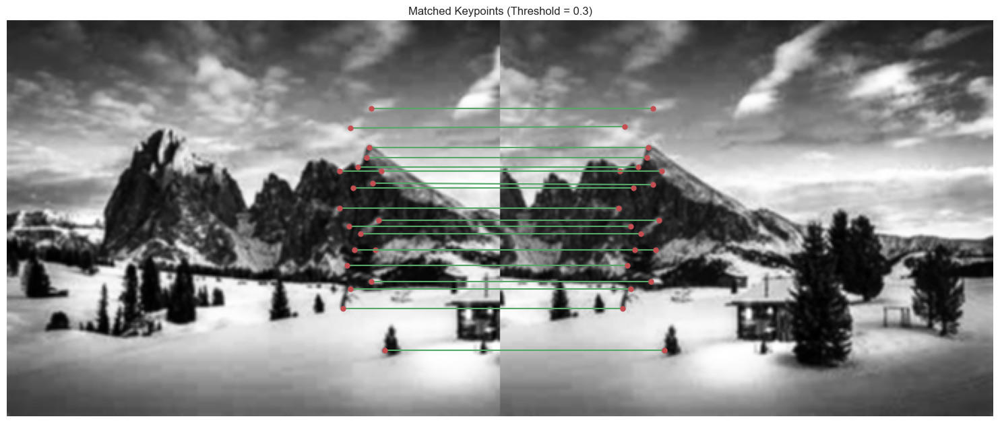

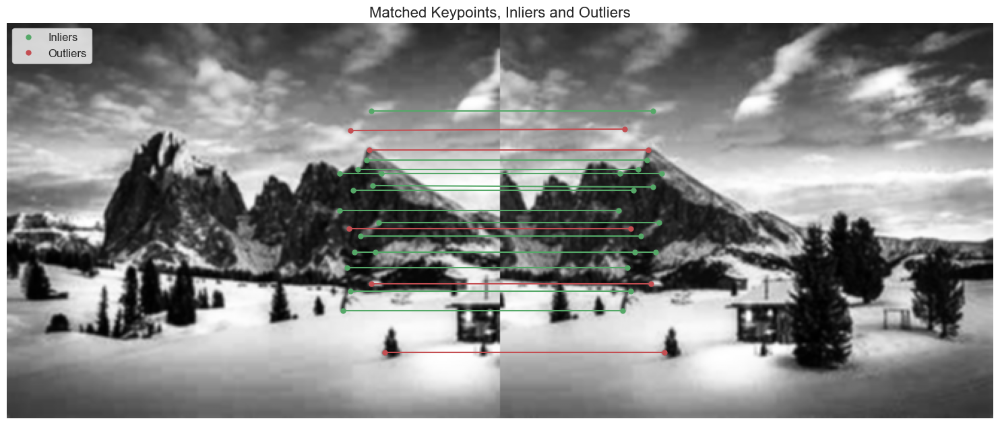

Best Translation Matrix:
 [[ 5.53765294e-01 -6.74987741e-02  1.56702409e+02]
 [-1.44517756e-01  8.13909889e-01  1.73063508e+01]
 [-1.21459657e-03 -3.17246413e-04  1.00000000e+00]]
Inliers indices: [15, 18, 30, 34, 64, 67, 76, 78, 81, 91, 95, 113, 128, 158, 164]
Number of inliers: 15
Inrliers average residual: 0.4423104930466464
number of outliers 5
average residual of keypoints 1.1075384198307954


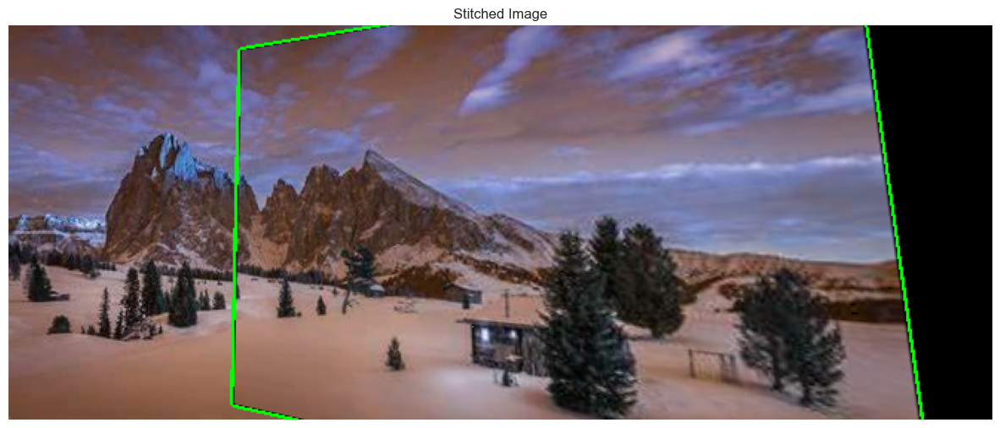

In [ ]:

combined_image = np.hstack((left_gray, right_gray))
keypoints_l, des1, keypoints_r, des2, _ = sift_descriptor_from_coords(left_gray, right_gray, threshold = 1, k = K, min_distance=MIN_DISTANCE, plot ="True")
des1_l2 = normalize_descriptor(des1)
des2_l2 = normalize_descriptor(des2)

ransac = Ransac(n_iterations=N_ITERATIONS, threshold=ERROR, threshold_matches=THRESHOLD_MATCHES, sample_size=4)
hom_trans, inliers_rl = ransac.ransac_transf(keypoints_r, keypoints_l, des2_l2, des1_l2, right_gray, left_gray, vis_matches=True, vis_in_out=True)
print("Best Translation Matrix:\n", hom_trans)
print("Inliers indices:", inliers_rl)
print("Number of inliers:", len(inliers_rl))
print("Inrliers average residual:", ransac.average_residual_inliers)
print("number of outliers", len(ransac.outliers))
print("average residual of keypoints", np.mean(ransac.residuals))

ransac.stitch_images(left_img, right_img, hom_trans, borders = True)


# EXPERIMENTS
Metrics for the analysis: 
- Number of inliers
- Number of outliers
- Average residuals between transformed source points and destination points (based on coordinates) normalized on RANSAC, max threshold between 0 and 1. 
- Average residuals between transformed inliers and destination points. 

Output: ransac_experiments.csv
Contains all the metrics with respect to all combinations of parameters. 

In [42]:
import csv

def test_parameter_combinations(left_gray, right_gray, parameter_combinations):

    print("Number of Combination:", len(parameter_combinations))
    
    with open("ransac_experiments.csv", mode='w', newline='') as f:
        header = [
            'match_thr', 'sample_size', 'n_iterations', 'error', 'corner_thr', 
            'patch_size', 'min_distance', 'In_count', 'Out_count', 
            'Avg_res', 'Avg_In_res'
        ]
        writer = csv.DictWriter(f, fieldnames=header)
        
        # Scrivi l'header nel CSV
        writer.writeheader()        
        for i, params in tqdm(enumerate(parameter_combinations), total=len(parameter_combinations), desc="Testing Parameter Combinations"):
            THRESHOLD_MATCHES, SAMPLE_SIZE, N_ITERATIONS, ERROR, K,  PATCH_SIZE, MIN_DISTANCE= params
            keypoints_l, des1, keypoints_r, des2, _ = sift_descriptor_from_coords(left_gray, right_gray, threshold=1, k=K, min_distance=MIN_DISTANCE, size = PATCH_SIZE, plot=False)
            des1_l2 = normalize_descriptor(des1)
            des2_l2 = normalize_descriptor(des2)
            ransac = Ransac(n_iterations=N_ITERATIONS, threshold=ERROR, threshold_matches=THRESHOLD_MATCHES, sample_size=SAMPLE_SIZE)
            _, inliers_rl = ransac.ransac_transf(keypoints_r, keypoints_l, des2_l2, des1_l2, right_gray, left_gray, vis_matches=False, vis_in_out=False)
            num_outliers = len(ransac.outliers)

            writer.writerow({
            'match_thr': THRESHOLD_MATCHES,
            'sample_size': SAMPLE_SIZE,
            'n_iterations': N_ITERATIONS,
            'error': ERROR,
            'corner_thr': K,
            'patch_size': PATCH_SIZE,
            'min_distance': MIN_DISTANCE,
            'In_count': len(inliers_rl),
            'Out_count': num_outliers,
            'Avg_res': np.mean(ransac.residuals),
            'Avg_In_res': ransac.average_residual_inliers,
            })




parameter_combinations = {
    "threshold": [ 0.5, 0.6, 0.7],
    "sample_size": [4, 6],
    "iterations": [1000, 2000],
    "error": [0.2, 0.3, 0.4, 0.5, 0.6, 0.7],
    "corner_threshold": [0.0005, 0.001, 0.005, 0.01],
    "patch_size": [16, 32, 48],
    "min_distance": [3, 5],
}
combinations = list(itertools.product(
    parameter_combinations["threshold"], 
    parameter_combinations["sample_size"], 
    parameter_combinations["iterations"], 
    parameter_combinations["error"],
    parameter_combinations["corner_threshold"],
    parameter_combinations["patch_size"],
    parameter_combinations["min_distance"]

))
test_parameter_combinations(
    left_gray, right_gray, combinations
)



Number of Combination: 1728


Testing Parameter Combinations: 100%|██████████| 1728/1728 [25:36<00:00,  1.12it/s]


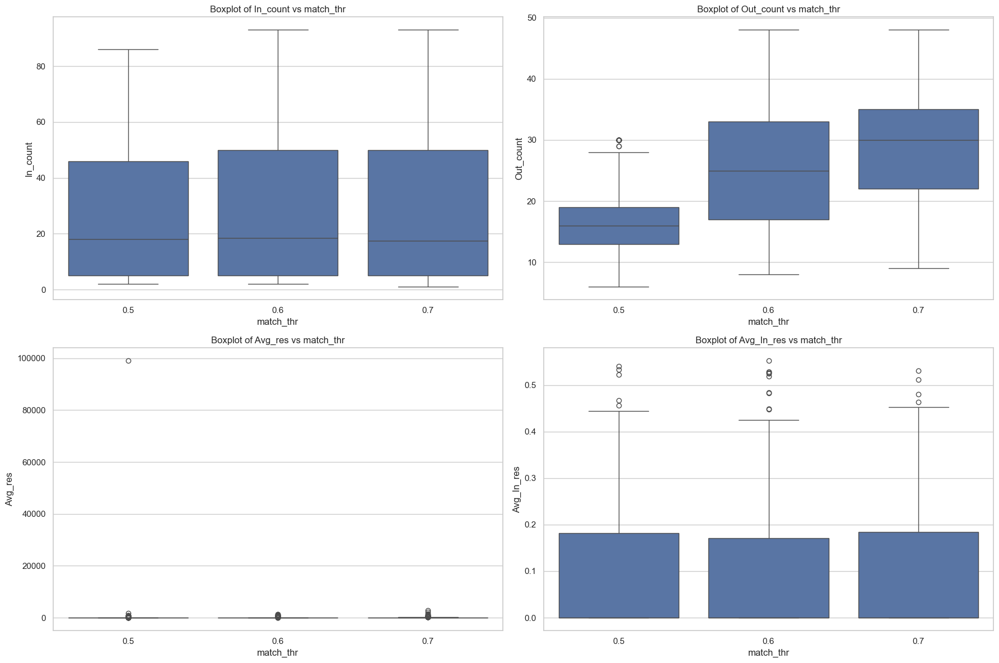

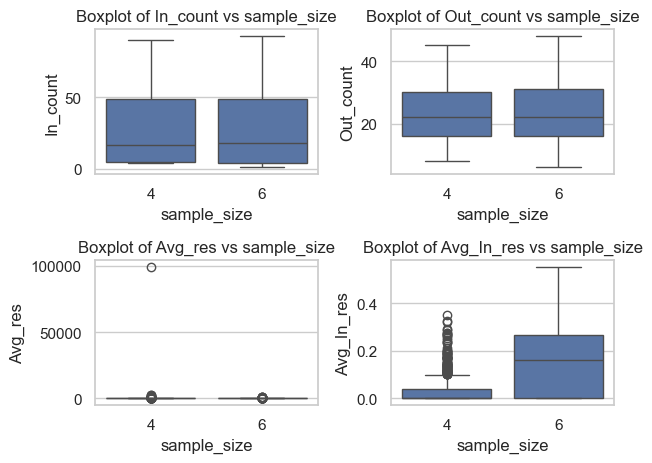

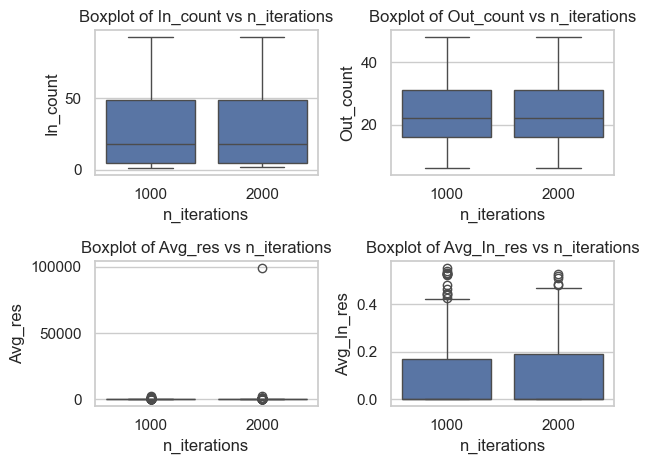

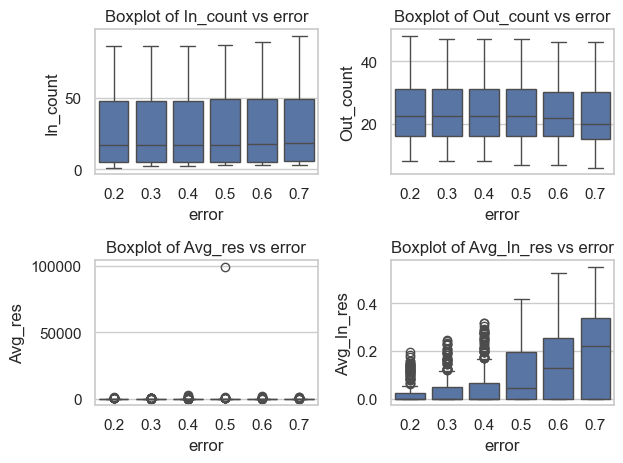

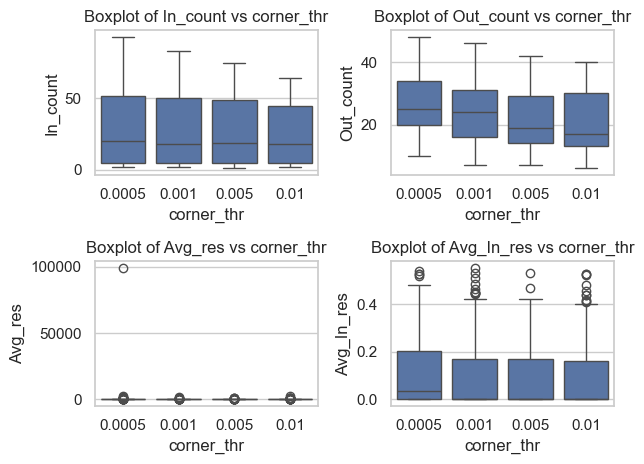

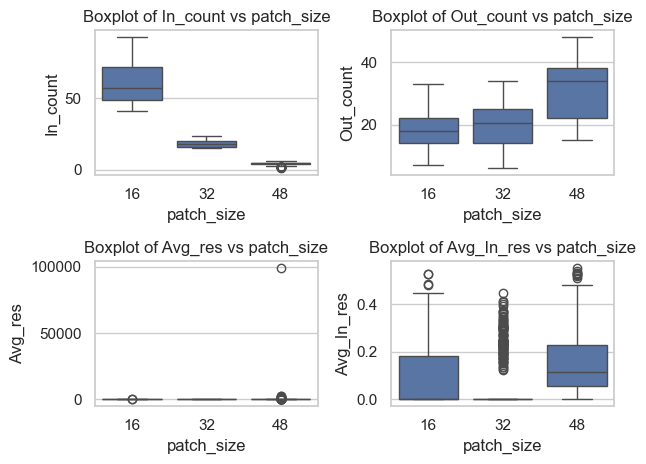

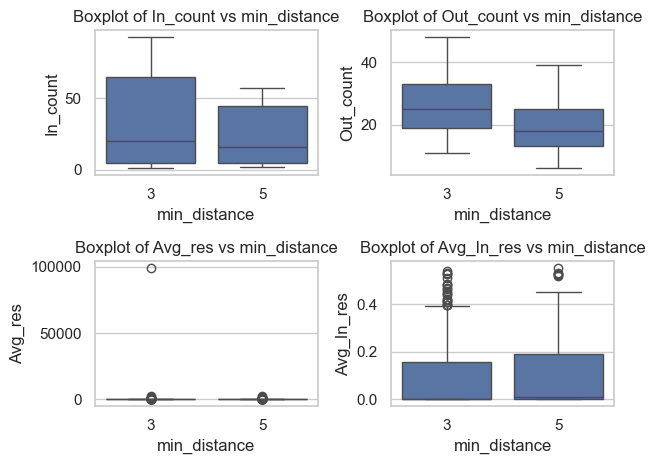

In [49]:
experiments_df = pd.read_csv("ransac_experiments.csv")


def plot_boxplots(results_df):
    plt.figure(figsize=(18, 12))
    sns.set(style="whitegrid")

    features = ['match_thr', 'sample_size', 'n_iterations', 'error', 
                'corner_thr', 'patch_size', 'min_distance']
    
    variables = ['In_count', 'Out_count', 'Avg_res', 'Avg_In_res']
    for f in features:
        for i, var in enumerate(variables):
            plt.subplot(2, 2, i+1)
            
            sns.boxplot(x=f, y=var, data=results_df)
            plt.title(f"Boxplot of {var} vs {f}")
            plt.xlabel(f'{f}')
            plt.ylabel(var)
            
        plt.tight_layout()
        plt.show()

plot_boxplots(experiments_df)


In [50]:

max_min_values = {
    'In_count': {'max': experiments_df['In_count'].max(), 'min': experiments_df['In_count'].min()},
    'Out_count': {'max': experiments_df['Out_count'].max(), 'min': experiments_df['Out_count'].min()},
    'Avg_res': {'max': experiments_df['Avg_res'].max(), 'min': experiments_df['Avg_res'].min()},
    'Avg_In_res': {'max': experiments_df['Avg_In_res'].max(), 'min': experiments_df['Avg_In_res'].min()}
}

max_min_rows = {
    column: {
        'max_row': experiments_df[experiments_df[column] == max_min_values[column]['max']],
        'min_row': experiments_df[experiments_df[column] == max_min_values[column]['min']]
    }
    for column in max_min_values
}
for column, rows in max_min_rows.items():
        print(f"\nSummary for Max Row of {column}:")
        summary = rows['max_row'].describe()
        formatted_summary = summary.apply(lambda col: col.map(lambda x: f"{x:.2f}" if isinstance(x, (float, int)) else x) if col.dtype.kind in 'fi' else col)
        print(formatted_summary)

        print(f"\nSummary for Min Row of {column}:")
        summary = rows['min_row'].describe()
        formatted_summary = summary.apply(lambda col: col.map(lambda x: f"{x:.2f}" if isinstance(x, (float, int)) else x) if col.dtype.kind in 'fi' else col)
        print(formatted_summary)




Summary for Max Row of In_count:
      match_thr sample_size n_iterations error corner_thr patch_size  \
count      3.00        3.00         3.00  3.00       3.00       3.00   
mean       0.63        6.00      1333.33  0.70       0.00      16.00   
std        0.06        0.00       577.35  0.00       0.00       0.00   
min        0.60        6.00      1000.00  0.70       0.00      16.00   
25%        0.60        6.00      1000.00  0.70       0.00      16.00   
50%        0.60        6.00      1000.00  0.70       0.00      16.00   
75%        0.65        6.00      1500.00  0.70       0.00      16.00   
max        0.70        6.00      2000.00  0.70       0.00      16.00   

      min_distance In_count Out_count Avg_res Avg_In_res  
count         3.00     3.00      3.00    3.00       3.00  
mean          3.00    93.00     24.67    0.77       0.46  
std           0.00     0.00      1.15    0.08       0.08  
min           3.00    93.00     24.00    0.68       0.36  
25%           3.00    

# EXPERIMENTS WITH SOME IMAGES

(313, 328)
(313, 225)
Detected 1636 keypoints.


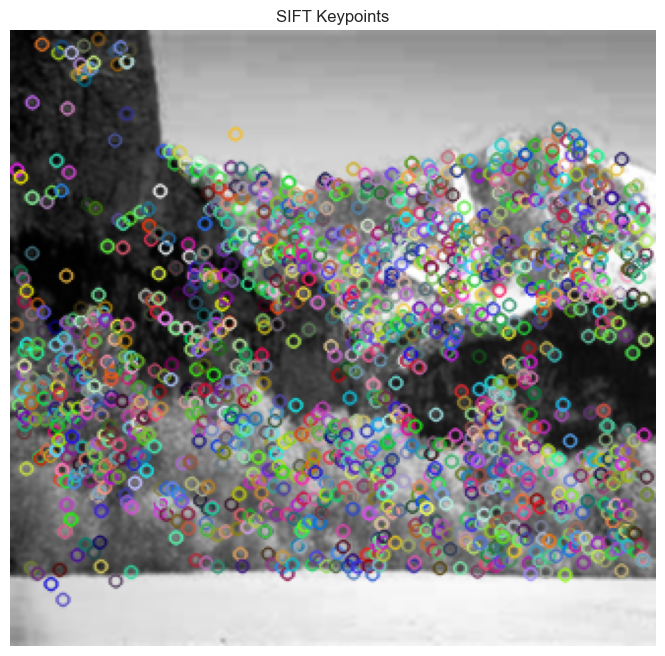

Detected 695 keypoints.


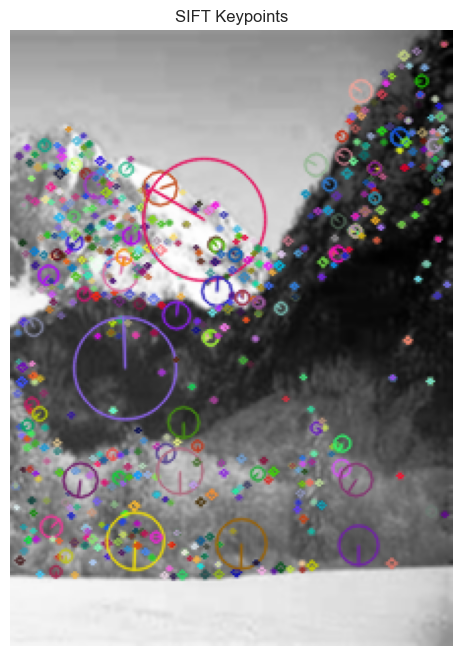

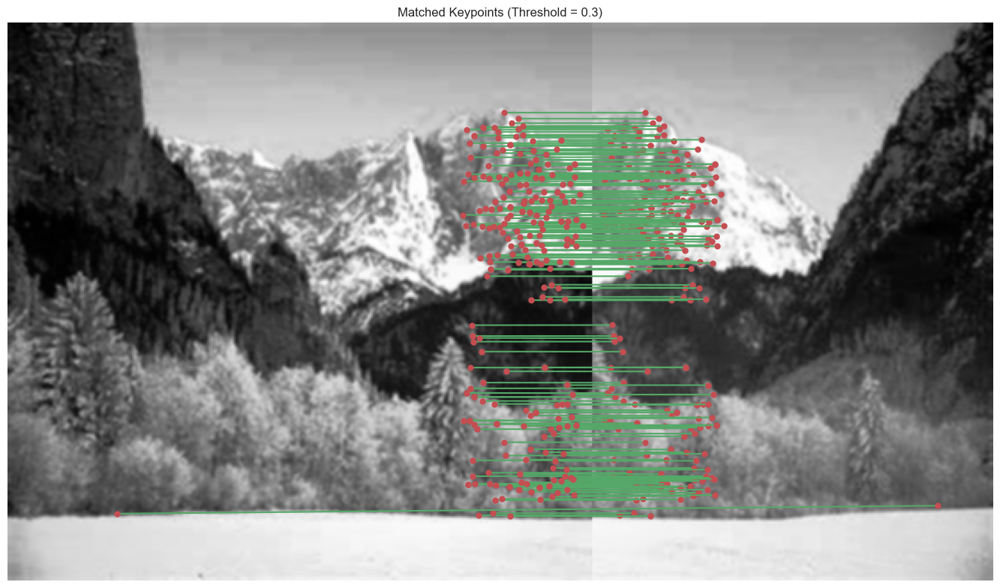

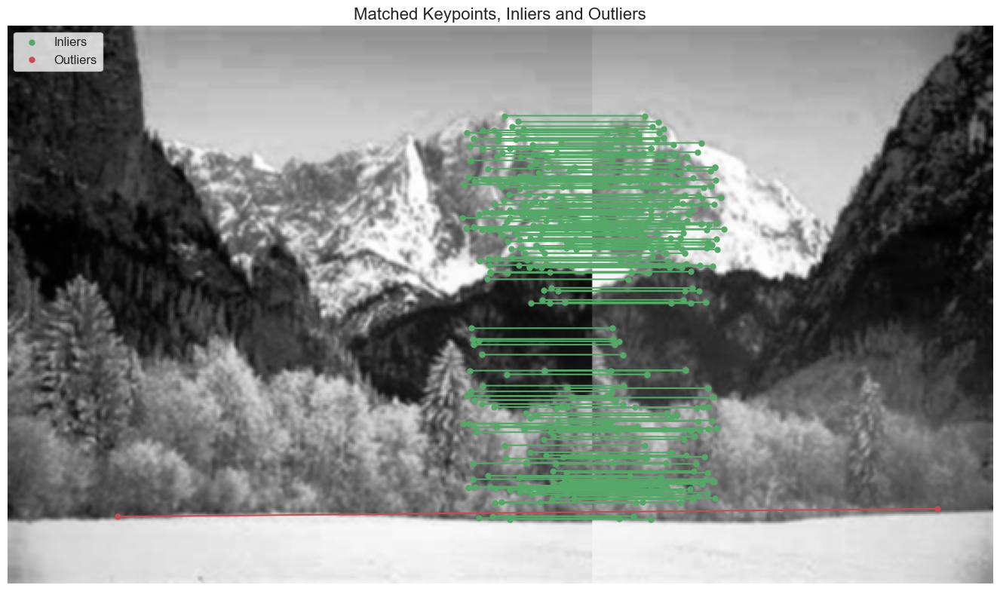

Best Translation Matrix:
 [[ 9.74772329e-01 -7.10074195e-03  2.49285556e+02]
 [-9.66171922e-03  9.88762553e-01  1.08501690e+00]
 [-6.16646348e-05 -2.46228733e-05  1.00000000e+00]]
Inliers indices: [13, 15, 16, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 38, 39, 40, 41, 42, 44, 45, 46, 48, 49, 50, 51, 53, 54, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 95, 96, 97, 98, 102, 103, 104, 105, 107, 108, 109, 110, 111, 112, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 128, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 143, 145, 146, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 168, 169, 170, 171, 173, 174, 175, 176, 178, 179, 181, 182, 183, 185, 186, 187, 188, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 217, 218, 219, 220, 221, 223, 224, 225, 228, 229, 231, 232, 233, 236, 

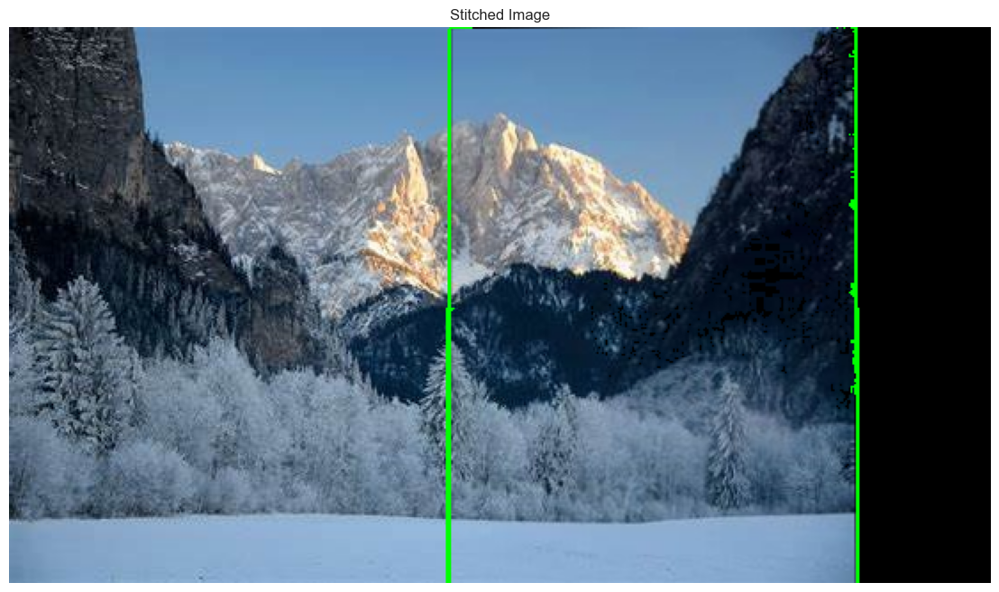

In [45]:
left_img = cv2.imread('Data\\snow_left.jpeg')  # Carica l'immagine di sinistra
right_img = cv2.imread('Data/snow_right.jpeg')  # Carica l'immagine di destra


# plt.figure(figsize=(12, 6))

# plt.subplot(1, 2, 1)
# plt.imshow(cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB))  # Converti BGR in RGB per la visualizzazione
# plt.title("Left Image")
# plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB))  # Converti BGR in RGB per la visualizzazione
# plt.title("Right Image")
# plt.axis('off')

# plt.show()

left_gray = color.rgb2gray(left_img)
right_gray = color.rgb2gray(right_img)

print(left_gray.shape)
print(right_gray.shape)

# plt.figure(figsize=(8, 6))
# plt.imshow(left_img, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')
# plt.show()

left_gray_8bit = (left_gray * 255).astype(np.uint8)
right_gray_8bit = (right_gray * 255).astype(np.uint8)
left_gray = cv2.equalizeHist(left_gray_8bit)
right_gray = cv2.equalizeHist(right_gray_8bit)
left_gray = cv2.GaussianBlur(left_gray, (3, 3), 1)
right_gray = cv2.GaussianBlur(right_gray, (3, 3), 1)


# plt.figure(figsize=(8, 6))
# plt.imshow(right_gray, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')
# plt.show()

sift = cv2.SIFT_create()
keypoints_l, descriptors_l = sift.detectAndCompute(left_gray, None, )
print(f"Detected {len(keypoints_l)} keypoints.")

img_with_keypoints = cv2.drawKeypoints(
    left_gray,
    keypoints_l,
    left_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

sift = cv2.SIFT_create()
keypoints_r, descriptors_r = sift.detectAndCompute(right_gray, None)

print(f"Detected {len(keypoints_r)} keypoints.")

img_with_keypoints = cv2.drawKeypoints(
    right_gray,
    keypoints_r,
    right_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

desc1_l2 = normalize_descriptor(descriptors_l)
desc2_l2 = normalize_descriptor(descriptors_r)
combined_image = np.hstack((left_gray, right_gray))
ransac = Ransac(n_iterations=N_ITERATIONS, threshold=0.5, threshold_matches=0.3, sample_size=4)
affine_matrix, inliers_rl = ransac.ransac_transf(keypoints_r, keypoints_l, desc2_l2, desc1_l2, right_gray, left_gray, vis_matches="True", vis_in_out="True")
print("Best Translation Matrix:\n", affine_matrix)
print("Inliers indices:", inliers_rl)
ransac.stitch_images(left_img, right_img, affine_matrix, borders=True)

(560, 840)
(463, 307)
Detected 7706 keypoints.


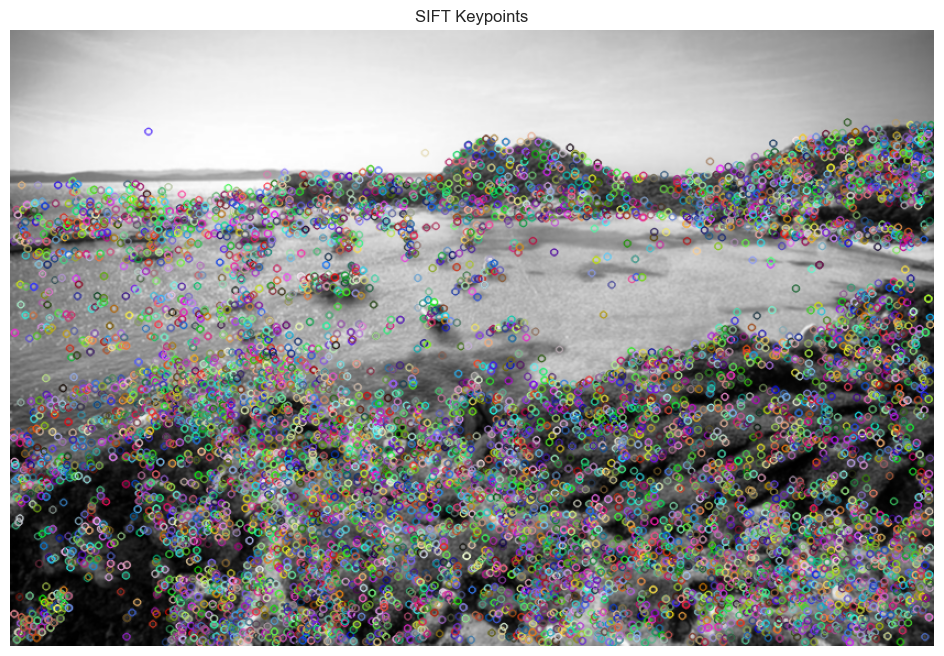

Detected 2754 keypoints.


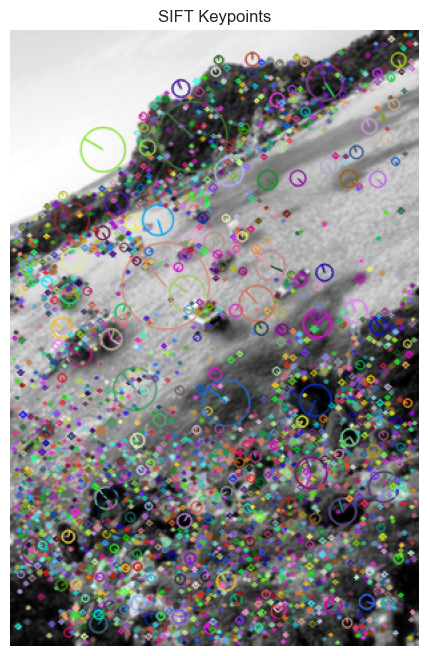

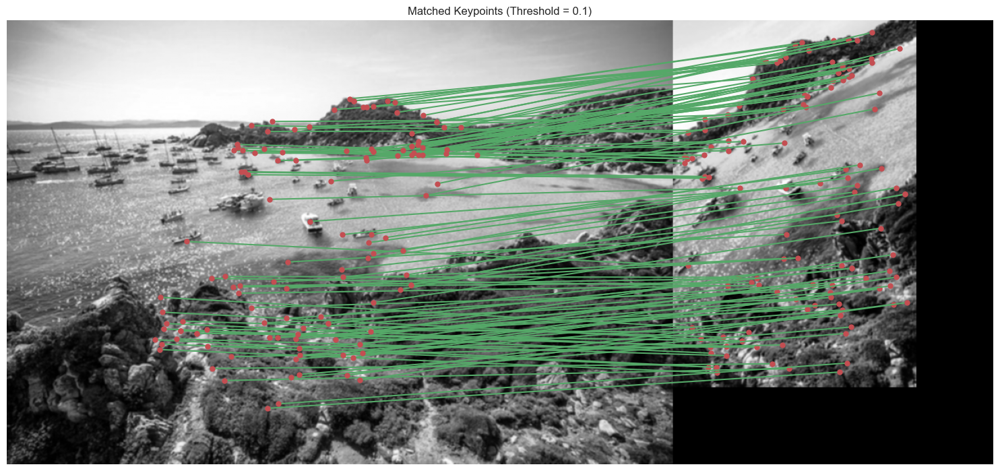

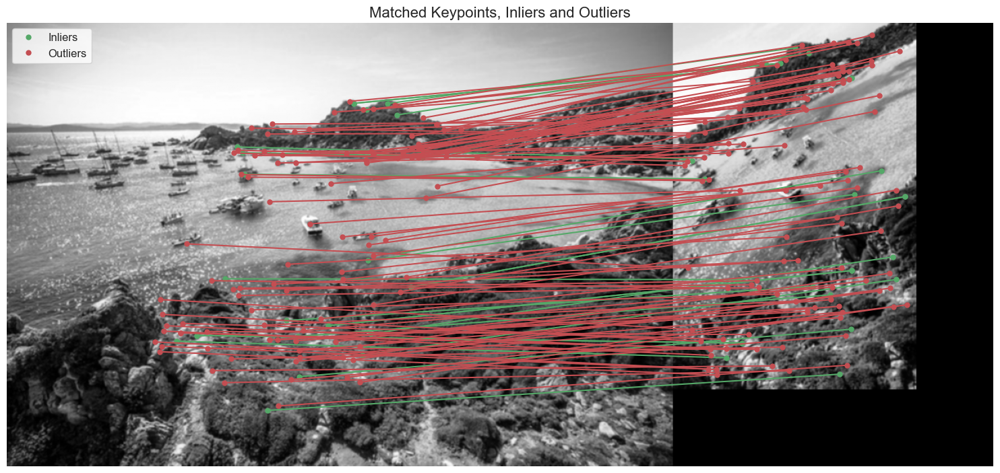

Best Translation Matrix:
 [[ 8.73055054e-01 -4.85498695e-01  3.60392915e+02]
 [ 4.85948966e-01  8.74839725e-01 -4.40122063e-01]
 [-2.60387818e-06  3.13940595e-06  1.00000000e+00]]
Inliers indices: [119, 194, 336, 625, 751, 784, 785, 1065, 1066, 1232, 1457, 1617, 1667, 1847, 2012, 2142, 2146, 2148, 2150, 2179, 2439, 2552, 2589, 2671, 2672]


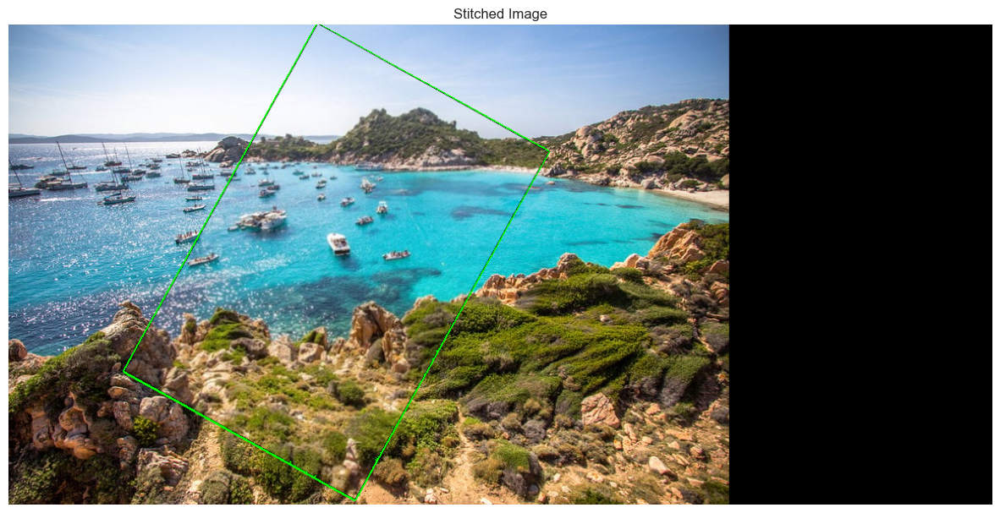

In [46]:


left_img = cv2.imread('Data\\sardinia.jpg') 
right_img = cv2.imread('Data/sardinia2.jpg')  

# plt.figure(figsize=(12, 6))

# plt.subplot(1, 2, 1)
# plt.imshow(cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB))  # Converti BGR in RGB per la visualizzazione
# plt.title("Left Image")
# plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB))  # Converti BGR in RGB per la visualizzazione
# plt.title("Right Image")
# plt.axis('off')

# plt.show()

left_gray = color.rgb2gray(left_img)
right_gray = color.rgb2gray(right_img)

print(left_gray.shape)
print(right_gray.shape)
# plt.figure(figsize=(8, 6))
# plt.imshow(left_img, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')
# plt.show()

left_gray_8bit = (left_gray * 255).astype(np.uint8)
right_gray_8bit = (right_gray * 255).astype(np.uint8)
left_gray = cv2.equalizeHist(left_gray_8bit)
right_gray = cv2.equalizeHist(right_gray_8bit)
left_gray = cv2.GaussianBlur(left_gray, (3, 3), 1)
right_gray = cv2.GaussianBlur(right_gray, (3, 3), 1)


# plt.figure(figsize=(8, 6))
# plt.imshow(right_gray, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')
# plt.show()

sift = cv2.SIFT_create()
keypoints_l, descriptors_l = sift.detectAndCompute(left_gray, None, )
print(f"Detected {len(keypoints_l)} keypoints.")

img_with_keypoints = cv2.drawKeypoints(
    left_gray,
    keypoints_l,
    left_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

sift = cv2.SIFT_create()
keypoints_r, descriptors_r = sift.detectAndCompute(right_gray, None)

print(f"Detected {len(keypoints_r)} keypoints.")

img_with_keypoints = cv2.drawKeypoints(
    right_gray,
    keypoints_r,
    right_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

desc1_l2 = normalize_descriptor(descriptors_l)
desc2_l2 = normalize_descriptor(descriptors_r)
# Perform RANSAC to find the best affine transformation (mapping points from right image to left image)
ransac = Ransac(n_iterations=N_ITERATIONS, threshold=0.05, threshold_matches=0.1, sample_size=4)
affine_matrix, inliers_rl = ransac.ransac_transf(
    keypoints_r, keypoints_l, desc2_l2, desc1_l2, right_gray, left_gray, vis_matches="True", vis_in_out="True"
)
outliers_indeces = ransac.outliers
print("Best Translation Matrix:\n", affine_matrix)
print("Inliers indices:", inliers_rl)
panorama_height = left_img.shape[0]
panorama_width = left_img.shape[1] + right_img.shape[1]
panorama_size = (panorama_width, panorama_height) 
panorama = np.zeros((panorama_height, panorama_width, 3), dtype=np.uint8)
panorama[: left_img.shape[0], : left_img.shape[1]] = left_img

img2_warped = cv2.warpPerspective(right_img, affine_matrix, panorama_size)
h2, w2 = right_img.shape[:2]
corners = np.float32([[0, 0], [w2, 0], [w2, h2], [0, h2]]).reshape(-1, 1, 2)
transformed_corners = cv2.perspectiveTransform(corners, affine_matrix).astype(np.int32)
cv2.polylines(panorama, [transformed_corners], isClosed=True, color=(0, 255, 0), thickness=4)

mask = np.all(img2_warped > [0, 0, 0], axis=2)
panorama[mask] = img2_warped[mask]

plt.figure(figsize=(15, 8))
plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
plt.title("Stitched Image")
plt.axis('off')
plt.show()

